

# <h1><center>Costa Rican Household Poverty Level Prediction</center></h1>

## <center>158755 Data Science Project 3 (group report)</center>

Project overview:  

Can you identify which households have the highest need for social welfare assistance?


Inter-American Development Bank


### Dataset url:

https://www.kaggle.com/c/9840/download-all

https://www.kaggle.com/c/9840



By:   
**Jerry Wang, student ID: 02304430**  
**Kunzi Xie, student ID: 15283483**  
  
  
  
## 1 Abstract

In this report, we implemented some machine learning algorithms to predict the poverty level of Costa Rican household. First, we performed an exploratory data analysis of the dataset, then researched various features and used multiple algorithms to build the predictive models for the problem. At last, one of the predictive models was submitted to Kaggle.com for final scoring, which obtained a score of 0.414, which ranked at 209 out of 619 teams.




## 2 Kaggle competition score board

Our team has worked on Kaggle at very early stage, below is one of the screen shot before the project submission deadline of 12/Sep/2018.  
(time: 10/Sep/2018 at 9:27am)

<img src="input/0 before 12 sep 2018.png" alt="best score" width="800"/>

The best score result(LightGBM):

<img src="input/9 best score.png" alt="best score" width="800"/>


In general, we only select k most similar object data in the sample dataset, which is the source of k in the k-nearest neighbor algorithm, usually k is an integer not greater than 20. Finally, the classification of the data to be tested is judged according to the characteristics and attributes of the k data.

Below is the scores for different kNN models at different k values and metrics:


| k value | matric    | features    | score     |
| :------ | :--------: |:------------:|:-----------:|
| 5     | Euclidean  |8         |0.298      |
| 3     | Euclidean  |8         |0.299      |
| 3     | Euclidean  |125        |0.340      |
| 5     | Euclidean  |125         |0.349      |
| 11    | Euclidean  |125         |0.319      |
|       |    |         |      |
|   2    |  Manhattan    |    125     |   0.321   |
|   5    |  Manhattan    |    125     |   <font color='red'>0.354 </font>  |
|   8    |  Manhattan    |    125     |   0.339   |
|       |    |         |      |
|   5    |  Chebyshev  |    125     |   0.321   |
|   5    |  Seuclidean  |    125     |   0.349   |
|       |    |         |      |
|       on normalized data:      |
|   5    |  Manhattan    |    125     |   0.345   |

As the score results were not very good when we used kNN predictive models (the highest kNN score was 0.354), we started to implemented other predictiive models to gain a better results, like Random Forest, Naive Bayes, Logistic Regression, and LightGBM models. The Keggle results are shown below:

|  Model    | Features    | Score     |Note      |
| :--------: |:------------:|:-----------:|:----------- |
| Random Forest    | 125 features   |  0.352      |max_depth=50, random_state=42
| Random Forest    | 8 features  |  0.372         |      |
|             |             |            |      |
| Naive Bayers    | 125 features  |  0.288      |      |
| Naive Bayers    | 8 features      | 0.313      |      |
|             |               |         |      |
| Logistical Regression    | 125 features      | 0.274      |* Regression model is not suitable for this job      |
|             |               |         |      |
| LGBM    |  125 features    | 0.407   |      |
|LGBM  |  128 features    | <font color='red'>0.414  </font>  |  With 3 engineered features    |

The Kaggle lead board screen shots for different predictive models  are shown below:

1, first kNN model, 8 features, k=5, euclidean, scored 0.298

<img src="input/1 k=5 euclidean 8 features score 0.298.png" alt="1st knn 8 feats k=5 euclidean" width="800"/>

2, second kNN model, 8 features, k=3, euclidean, scored 0.299

<img src="input/2 k=3 euclidean 8 feature score 0.299.png" alt="2nd knn 8 feats k=3 euclidean" width="800"/>


3, kNN model, 125 features, k=3,  euclidean, scored 0.340

<img src="input/3 k=3 more feature euclidean score 0.340.png" alt="3rd knn 125 feats k=3 euclidean" width="800"/>


4, kNN model, 125 features, k=5, euclidean, scored 0.349

<img src="input/4 k=5 more feature euclidean score 0.349.png" alt="4th knn 125 feats k=5 euclidean" width="800"/>


5, kNN model, 125 features, k=5, manhattan, scored 0.354

<img src="input/5 k=5 more feature manhattan score 0.354.png" alt="5th knn 125 feats k=5 manhattan" width="800"/>


6, LightGBM, 125 features, scored 0.407

<img src="input/6 light gbm score 0.407.png" alt="lightgbm 125 feats 0.407" width="800"/>


7, LightGBM, 128 features (125 plus 3 engineered features), scored 0.414

<img src="input/7 lgbm add engineerd features 0.414.png" alt="lightgbm 128 feats 0.414" width="800"/>


8, Part of the list of our group experimental scores are as below, which showed both team members have contributed to the job:

<img src="input/8 group work on different algorithms.png" alt="before 12/Sep" width="800"/>



## 3 Data Wrangling

Import libraries and setup environment

In [1]:
# 1: import libraries
import sys
#!{sys.executable} -m pip install numpy==1.13.3
import numpy as np
import pandas as pd

pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('html.table_schema', True)
pd.set_option('display.html.border', 1)
pd.set_option('max_columns', 30)
pd.set_option('max_rows', 150)

import matplotlib
import matplotlib.pyplot as plt
from pylab import rcParams
import seaborn as sns
import warnings
%matplotlib inline

In [2]:
sns.set(style="ticks")
rcParams['figure.figsize'] = 15, 8
rcParams['font.size'] = 20
rcParams['axes.facecolor'] = 'white'
rcParams['figure.dpi'] = 350
rcParams['legend.fontsize'] = 20
rcParams['axes.labelsize']=20
rcParams['xtick.labelsize']=15
rcParams['ytick.labelsize']=15
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['patch.edgecolor'] = 'white'
rcParams['font.family'] = 'StixGeneral'
matplotlib.style.use('fivethirtyeight') 
warnings.filterwarnings(module='sklearn*', action='ignore', category=DeprecationWarning)

Read dataset from csv file

In [3]:
#2: read dataset from csv
df_train = pd.read_csv('../input/train.csv')
df_test = pd.read_csv('../input/test.csv')

Compare training set and testing set, we found only one different column:'Target', which is the prediction result.

In [4]:
# compare 2 datasets and find different columns name
diff_cols = [col for col in df_train.columns if col not in df_test.columns]
diff_cols


['Target']

Display information and describe of the dataset.

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9557 entries, 0 to 9556
Columns: 143 entries, Id to Target
dtypes: float64(8), int64(130), object(5)
memory usage: 10.4+ MB


In [6]:
df_train.describe()

,v2a1,hacdor,rooms,hacapo,v14a,refrig,v18q,v18q1,r4h1,r4h2,r4h3,r4m1,r4m2,r4m3,r4t1,...,lugar5,lugar6,area1,area2,age,SQBescolari,SQBage,SQBhogar_total,SQBedjefe,SQBhogar_nin,SQBovercrowding,SQBdependency,SQBmeaned,agesq,Target
count,2697.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,2215.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,...,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,9557.00,9552.00,9557.00,9557.00
mean,165231.61,0.04,4.96,0.02,0.99,0.96,0.23,1.40,0.39,1.56,1.95,0.40,1.66,2.06,0.79,...,0.09,0.08,0.71,0.29,34.30,74.22,1643.77,19.13,53.50,3.84,3.25,3.90,102.59,1643.77,3.30
std,150457.13,0.19,1.47,0.15,0.07,0.20,0.42,0.76,0.68,1.04,1.19,0.69,0.93,1.21,1.05,...,0.29,0.27,0.45,0.45,21.61,76.78,1741.20,18.75,78.45,6.95,4.13,12.51,93.52,1741.20,1.01
min,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.04,0.00,0.00,0.00,1.00
25%,80000.00,0.00,4.00,0.00,1.00,1.00,0.00,1.00,0.00,1.00,1.00,0.00,1.00,1.00,0.00,...,0.00,0.00,0.00,0.00,17.00,16.00,289.00,9.00,0.00,0.00,1.00,0.11,36.00,289.00,3.00
50%,130000.00,0.00,5.00,0.00,1.00,1.00,0.00,1.00,0.00,1.00,2.00,0.00,1.00,2.00,0.00,...,0.00,0.00,1.00,0.00,31.00,36.00,961.00,16.00,36.00,1.00,2.25,0.44,81.00,961.00,4.00
75%,200000.00,0.00,6.00,0.00,1.00,1.00,0.00,2.00,1.00,2.00,3.00,1.00,2.00,3.00,1.00,...,0.00,0.00,1.00,1.00,51.00,121.00,2601.00,25.00,81.00,4.00,4.00,1.78,134.56,2601.00,4.00
max,2353477.00,1.00,11.00,1.00,1.00,1.00,1.00,6.00,5.00,8.00,8.00,6.00,6.00,8.00,7.00,...,1.00,1.00,1.00,1.00,97.00,441.00,9409.00,169.00,441.00,81.00,36.00,64.00,1369.00,9409.00,4.00


From the information above, we need to find out how many data types we have in the 143 columns, and list the number of data types in the dataset:

In [7]:
df_train.dtypes.unique()

array([dtype('O'), dtype('float64'), dtype('int64')], dtype=object)

Plot the number of different data types

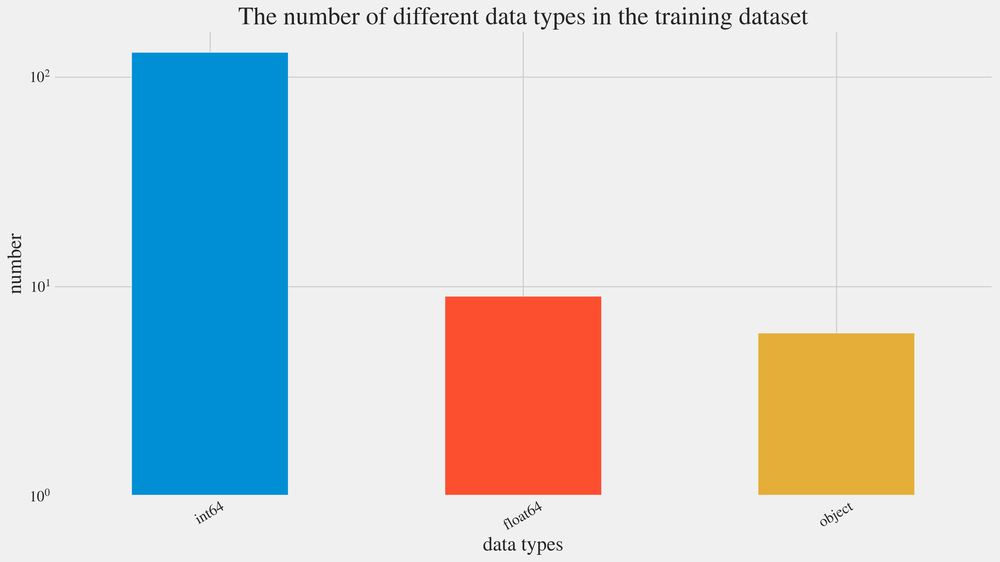

In [8]:
df_train.dtypes.value_counts().plot(kind='bar', log='y')
plt.xticks(rotation=30)
plt.xlabel('data types', fontsize=20)
plt.ylabel('number', fontsize=20)
plt.title('The number of different data types in the training dataset', size=25)
plt.show()

Find out columns with NaN values and display the unqiue values:

In [9]:
cols_with_na = df_train.columns[df_train.isna().any()].tolist()
cols_with_na

['v2a1', 'v18q1', 'rez_esc', 'meaneduc', 'SQBmeaned']

We can check those columns and depend on the contents, we can fill all above NaN values with 0:

In [10]:
#: fillna with 0, before that, check data intergarity
for col in cols_with_na:
    df_train[col].fillna(0,inplace=True)
    df_test[col].fillna(0,inplace=True)

Now we find all the columns data type as 'Object', and exclusive of 2 columns 'Id', 'idhogar' as they are unique indexes:

In [11]:
obj_cols = [col for col in df_train.columns if df_train[col].dtype =='O' and col not in ['Id', 'idhogar']]
obj_cols

['dependency', 'edjefe', 'edjefa']

In [12]:
df_train[obj_cols].head()

,dependency,edjefe,edjefa
0,no,10,no
1,8,12,no
2,8,no,11
3,yes,11,no
4,yes,11,no


Display unique values of all 3 columns:

In [13]:
for i in obj_cols:
    print i, ':', df_train[i].unique() , '\n', '-'*60

dependency : ['no' '8' 'yes' '3' '.5' '.25' '2' '.66666669' '.33333334' '1.5'
 '.40000001' '.75' '1.25' '.2' '2.5' '1.2' '4' '1.3333334' '2.25'
 '.22222222' '5' '.83333331' '.80000001' '6' '3.5' '1.6666666' '.2857143'
 '1.75' '.71428573' '.16666667' '.60000002'] 
------------------------------------------------------------
edjefe : ['10' '12' 'no' '11' '9' '15' '4' '6' '8' '17' '7' '16' '14' '5' '21' '2'
 '19' 'yes' '3' '18' '13' '20'] 
------------------------------------------------------------
edjefa : ['no' '11' '4' '10' '9' '15' '7' '14' '13' '8' '17' '6' '5' '3' '16' '19'
 'yes' '21' '12' '2' '20' '18'] 
------------------------------------------------------------


We have 'yes' and 'no' in the dataset, now we need to figure out what values do they represent.  

Read the unique values of 'hogar_adul' column, we can find 0 values, which means there is NO adult in the household. The same happens while there is no children and/or elderly in the household.

In [14]:
print "Adult number:", df_train['hogar_adul'].unique(), "Children number:", \
    df_train['hogar_nin'].unique(), "Elderly number:", df_train['hogar_mayor'].unique(), \
    "\nTotal number:", df_train['hogar_total'].unique()

Adult number: [1 2 3 4 5 9 6 7 0 8] Children number: [0 2 1 3 5 4 9 6 8 7] Elderly number: [0 1 2 3] 
Total number: [ 1  4  2  3  5  6 10  7  9 11  8 13 12]


**From above information, we can replace 'no' with '0', 'yes' with '1', and change the data type as float:**

In [15]:
#: fill with meaningful values - explain why
col_lists = ['dependency', 'edjefe', 'edjefa']
dataset_lists = [df_train, df_test]

for col in col_lists:
    for df in dataset_lists:
        df[col].replace('no', '0', inplace=True)
        df[col].replace('yes', '1', inplace=True)
        df[col] = df[col].astype(float)
        

In [16]:
df['dependency'].unique()

array([ 0.5       ,  0.        ,  8.        ,  1.        ,  0.25      ,
        2.        ,  0.33333334,  0.375     ,  0.60000002,  1.5       ,
        0.2       ,  0.75      ,  0.66666669,  3.        ,  0.14285715,
        0.40000001,  0.80000001,  1.6666666 ,  0.2857143 ,  1.25      ,
        2.5       ,  5.        ,  0.85714287,  1.3333334 ,  0.16666667,
        4.        ,  0.125     ,  0.83333331,  2.3333333 ,  7.        ,
        1.2       ,  3.5       ,  2.25      ,  3.3333333 ,  6.        ])

Final comparison of two dataset, they should contain only two Object type, being 'Id' and 'idhogar' as unique keys, the rest will be integer and float data types.

## 4 Data Visualization

In this part, we will explore the characteristics of the train dataset, and plot the visual graphs.

The graph below shows the number of unique int and float type columns values in the training dataset. It shows that most of the columns are binary values.

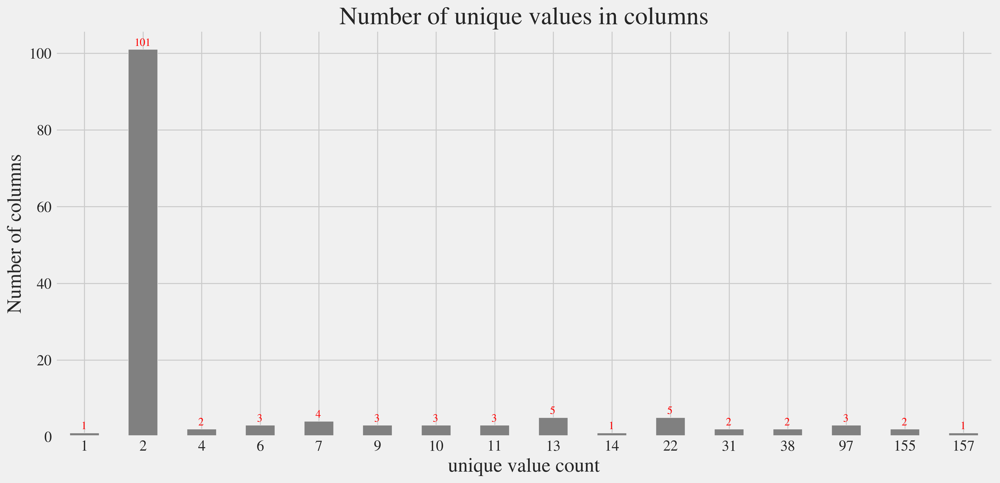

In [17]:
ax = df_train.select_dtypes(include=['float64', 'int64']).nunique().value_counts().sort_index() \
        .plot.bar(figsize = (15, 7), color='gray')
plt.xlabel('unique value count', fontsize=20)
plt.ylabel('Number of columns', fontsize=20)
plt.xticks(rotation=0)
plt.title('Number of unique values in columns', fontsize = 25)
for i in ax.patches:
    ax.text(i.get_x()+.1, i.get_height()+1, str(i.get_height()).rjust(3), fontsize=11, color='red') 
plt.show()

The goal is to predict the 'Target' column of the test dataset, which include 4 different poverty levels, from 1 to 4.

In [18]:
poverty_mapping = ['extreme poverty', 'moderate poverty', 'vulnerable households', 'non vulnerable households']

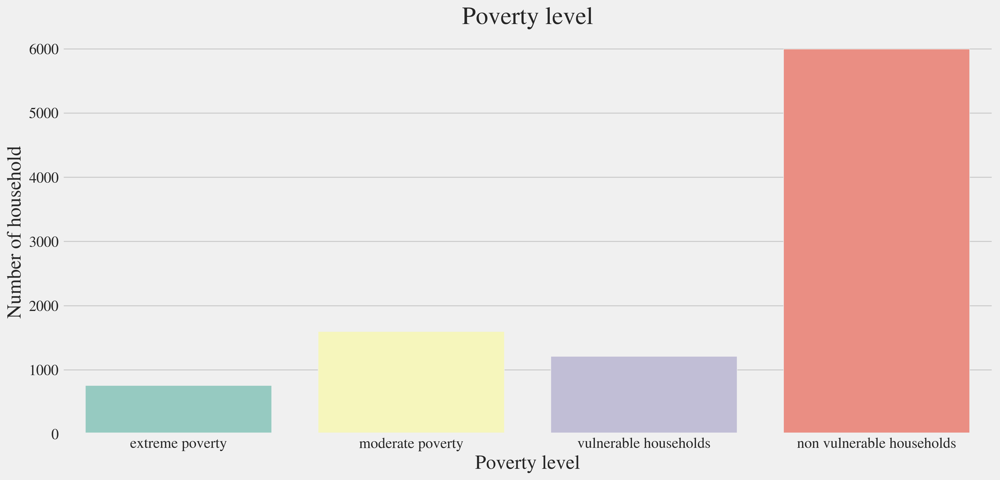

In [19]:
plt.figure(figsize = (15,7))
sns.countplot(x='Target', data=df_train , palette="Set3")
plt.xticks([0, 1, 2, 3], poverty_mapping)
plt.xlabel('Poverty level', fontsize=20)
plt.ylabel('Number of household', fontsize=20)
plt.title("Poverty level", fontsize = 25)
plt.show()

From the bar chart above, we can see that only about 10% of the household are in extreme poverty condition.  
The density figure below shown the age distribution in four poverty levels. The younger the age,  the lower the the poverty level.

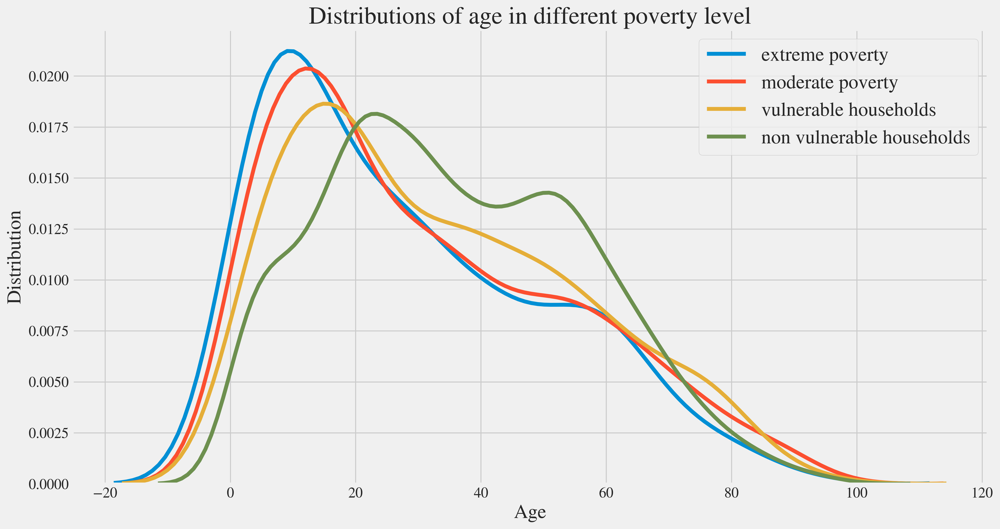

In [20]:
for i in range(1,5):
    sns.kdeplot(df_train.loc[df_train['Target']==i, 'age'], label = poverty_mapping[i-1])
plt.title('Distributions of age in different poverty level', size=25)
plt.xlabel('Age', size=20)
plt.ylabel('Distribution', size=20)
plt.legend()
plt.show()

The bar chart below shown that the percentage of young children (under 10 years old) are higher in poverty condition.

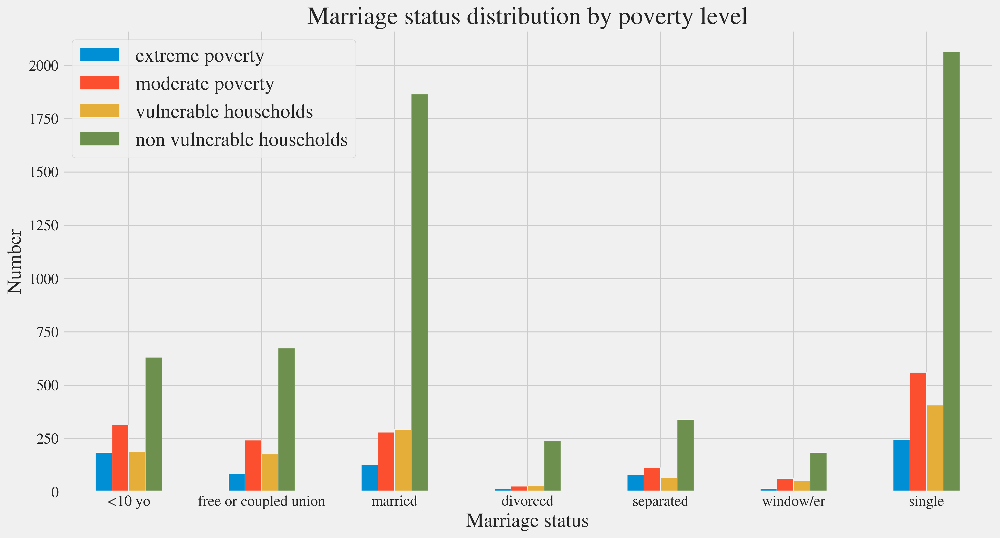

In [21]:
# barplot of marriage status grouped by poverty level
marriage_mapping = ['<10 yo', 'free or coupled union', 'married', 'divorced', 'separated', 'window/er', 'single']
marriage_mapping_number = [0, 1, 2, 3, 4, 5, 6]
pd.crosstab([df_train.estadocivil7, df_train.estadocivil6, df_train.estadocivil5, \
             df_train.estadocivil4, df_train.estadocivil3, df_train.estadocivil2, \
             df_train.estadocivil1], df_train.Target).plot(kind='bar')
plt.ylabel('Number', size=20)
plt.xlabel('Marriage status', size=20)
plt.title('Marriage status distribution by poverty level', size=25)
plt.xticks(marriage_mapping_number, marriage_mapping, rotation=0)
plt.legend(labels=poverty_mapping)
plt.show()

The violin plot below demonstrated the age distribution by sex for the four poverty levels, which also indicated that children at around 10 years old are higher in poverty.

/anaconda3/envs/py27/lib/python2.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/anaconda3/envs/py27/lib/python2.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


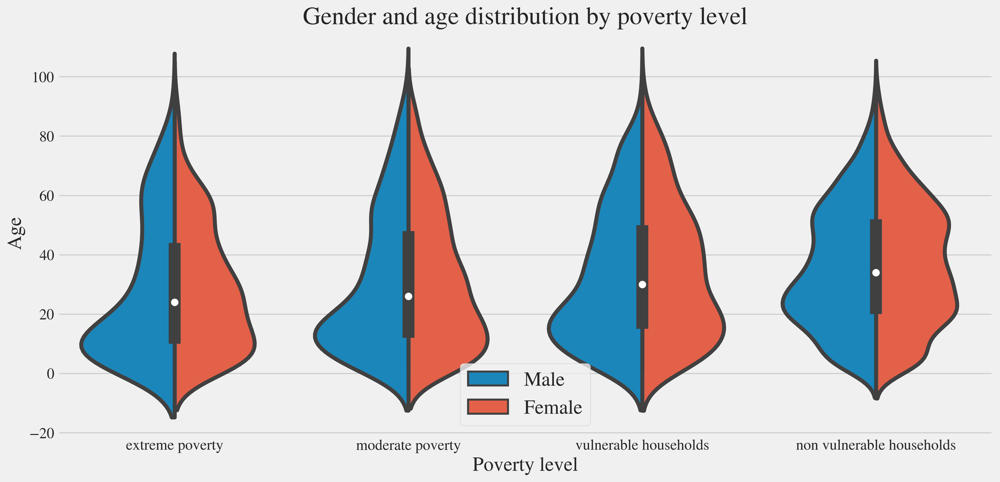

In [22]:
df_ = df_train[['Target', 'male', 'female', 'age']]
df_.loc[(df_train['male'] == 1), 'sex'] = 'Male'
df_.loc[(df_train['female'] == 1), 'sex'] = 'Female'
plt.figure(figsize = (15,7))
sns.violinplot(x='Target',y='age', data=df_, hue='sex', split=True)
plt.xticks([0, 1, 2, 3], poverty_mapping)
plt.title('Gender and age distribution by poverty level', size=25)
plt.xlabel('Poverty level', size=20)
plt.ylabel('Age', size=20)
plt.legend(loc='best')
plt.show()

The bar chart below showed that the home ownership status between household with and without rent payment. It indicated that most households own their own homes. 

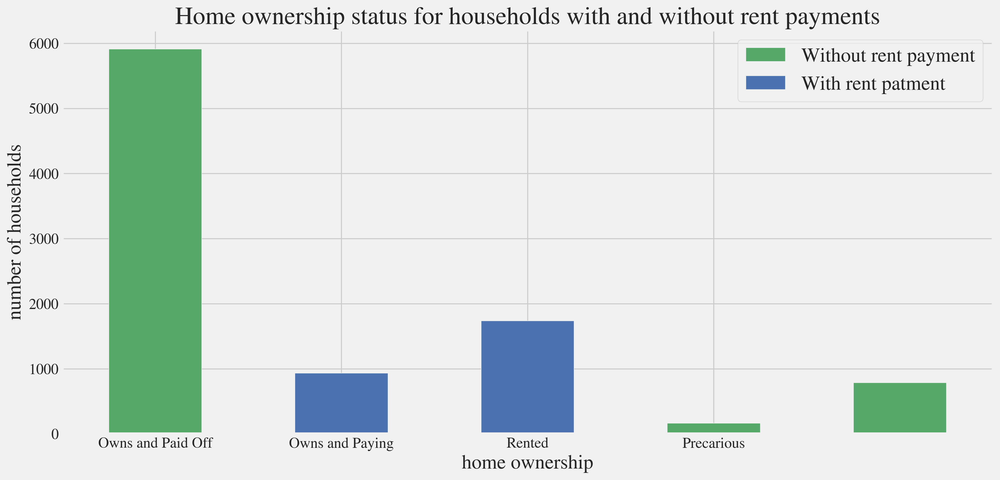

In [23]:
ownership_mapping = ['Owns and Paid Off', 'Owns and Paying', 'Rented', 'Precarious', 'Other']
rent_variables = [x for x in df_train if x.startswith('tipo')]
df_train.loc[df_train['v2a1']==0, rent_variables].sum().plot.bar(figsize = (15, 7),  color='g', \
                                                                 label='Without rent payment')
df_train.loc[df_train['v2a1']>0, rent_variables].sum().plot.bar(figsize = (15, 7), color='b', \
                                                                label='With rent patment')
plt.xticks([0, 1, 2, 3], ownership_mapping, rotation = 0)
plt.xlabel("home ownership", size=20)
plt.ylabel("number of households", size=20)
plt.legend()
plt.title('Home ownership status for households with and without rent payments', size = 25);

The bar chart below showed that different poverty level exists in all home ownership status, 

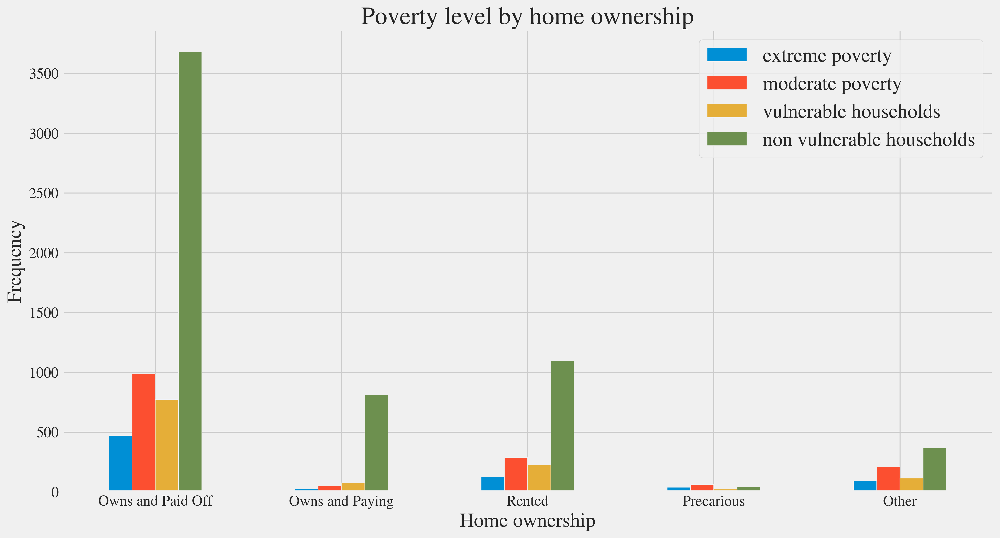

In [24]:
# barplot of poverty level by home ownership
pd.crosstab([df_train.tipovivi5, df_train.tipovivi4, df_train.tipovivi3, df_train.tipovivi2, \
             df_train.tipovivi1], df_train.Target).plot(kind='bar')
plt.title('Poverty level by home ownership', size=25)
plt.xlabel('Home ownership', size=20)
plt.xticks([0,1,2,3,4], ownership_mapping, rotation=0)
plt.ylabel('Frequency', size=20)
plt.yscale('linear')
plt.legend(labels=poverty_mapping)
plt.show()

The histogram below shows the education status, with most households have less than 10 years of schooling.

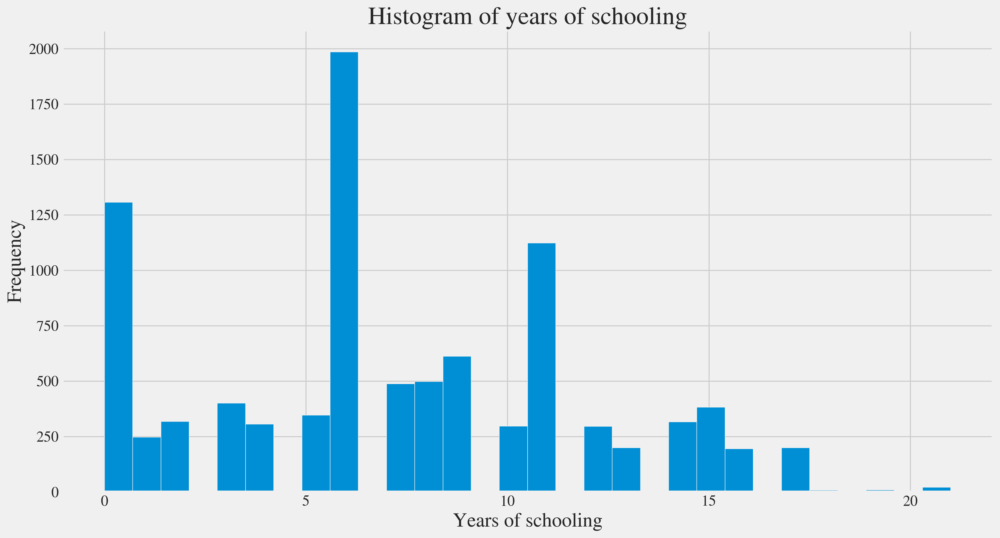

In [25]:
df_train.escolari.hist(bins=30)
plt.title('Histogram of years of schooling', size=25)
plt.xlabel('Years of schooling', size=20)
plt.ylabel('Frequency', size=20)
plt.show()

The multi bar chart below shows that the less years of schooling, the most likely being in extreme poverty.

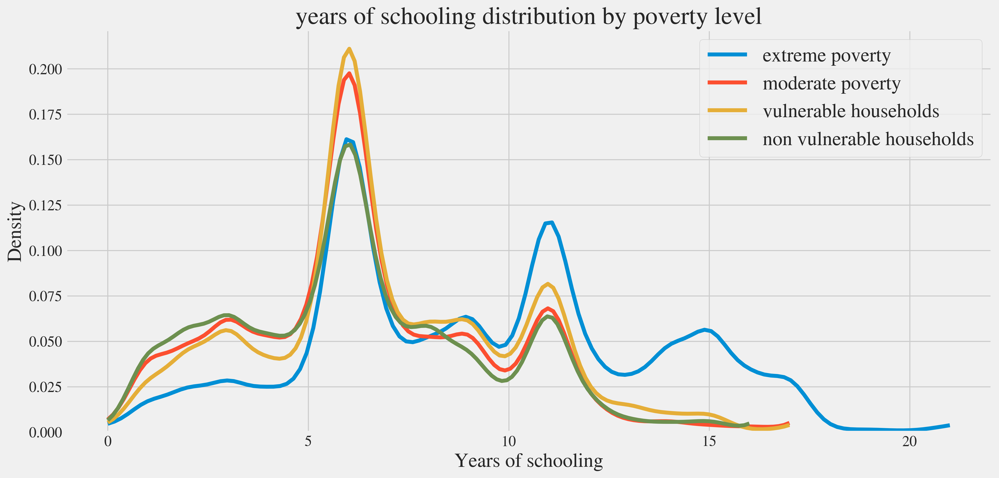

In [26]:
plt.figure(figsize = (15, 7))
for i, target in enumerate(df_train.Target.unique()):
    sns.kdeplot(df_train.loc[df_train['Target'] == target, 'escolari'].dropna(), \
                label = poverty_mapping[i], cut=0, bw=0.5)

plt.xlabel("Years of schooling", size=20)
plt.ylabel("Density", size=20)
plt.title('years of schooling distribution by poverty level', size=25)
plt.show()



The box chart below also give a description of years of schooling by four poverty levels. It indicated that the less the years in school the lower the poverty level.

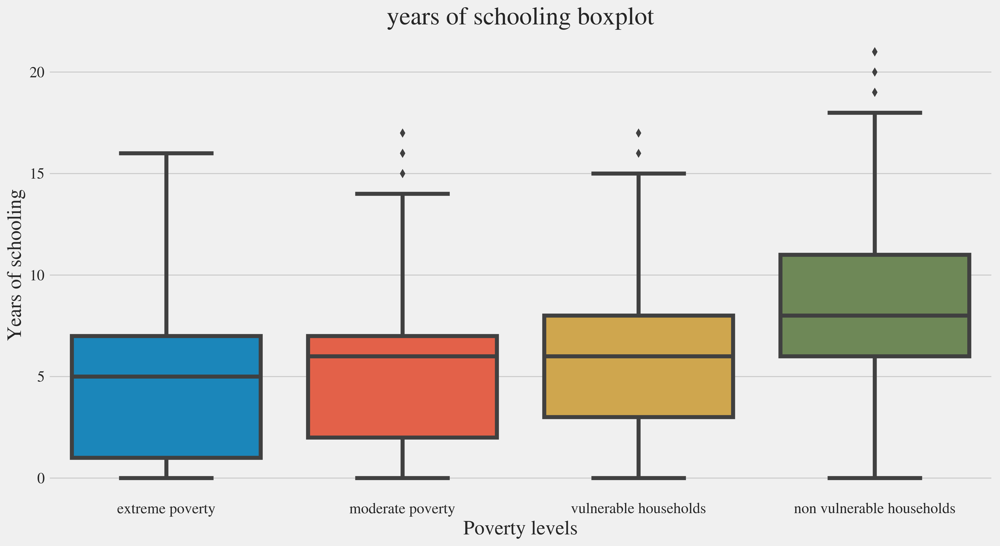

In [27]:
sns.boxplot(x = 'Target', y = 'escolari', data = df_train)
plt.ylabel('Years of schooling', size=20)
plt.xlabel('Poverty levels', size=20)
plt.xticks([0, 1, 2, 3], poverty_mapping)
plt.title('years of schooling boxplot', size=25)
plt.show()

The cat plot below showed that the distribution of the poverty level of either or not the head of the household.

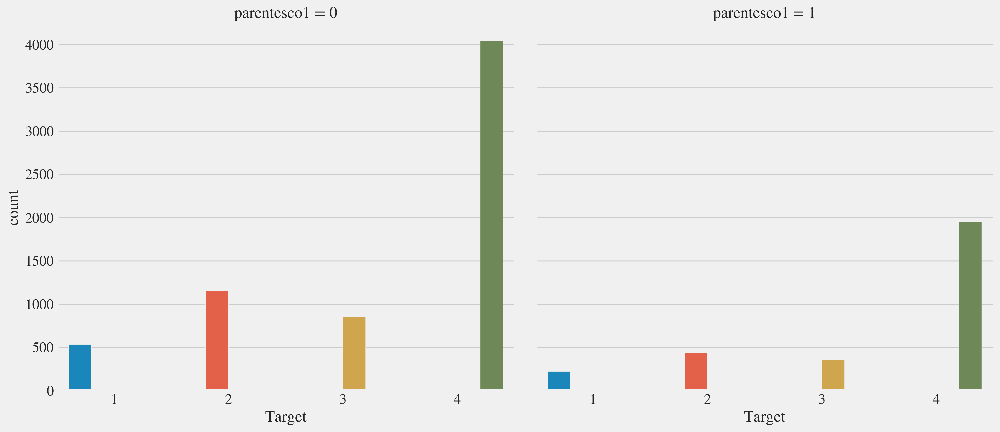

In [28]:
g = sns.catplot(x="Target", hue="Target", col="parentesco1", data=df_train, kind="count")
g.fig.set_size_inches(15,7)
plt.show()

The chart below showed that tablet, computer, etc is a key character to discriminate the poverty level.

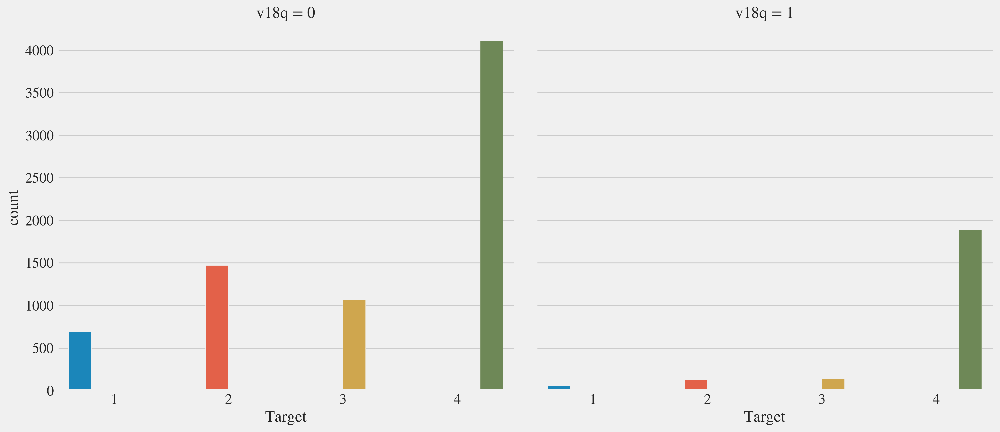

In [29]:
g = sns.catplot(x="Target", hue="Target", col="v18q", data=df_train, kind="count")
g.fig.set_size_inches(15,7)

The bar chart below shows the home appliance ownership by poverty level.

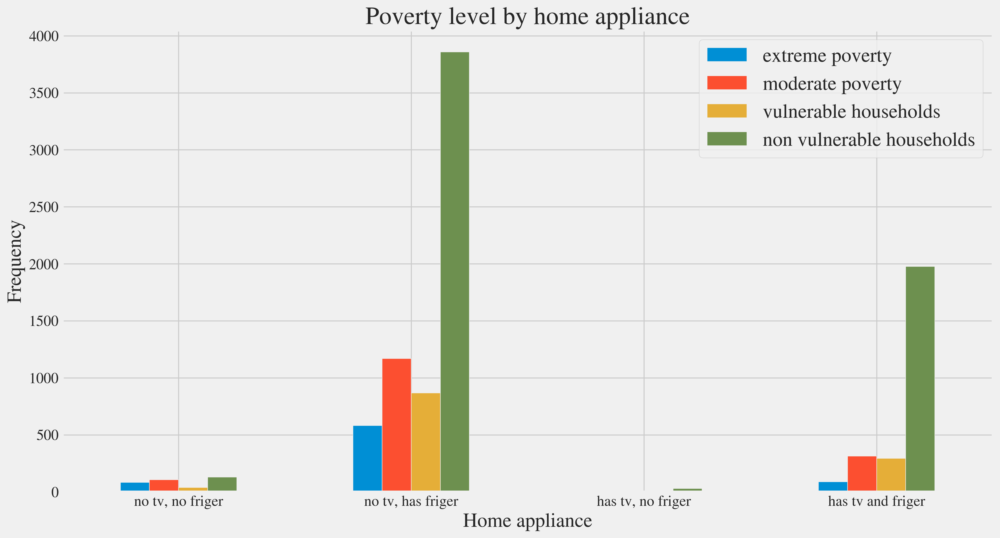

In [30]:
# barplot of poverty level by home appliance
pd.crosstab([df_train.television, df_train.refrig], df_train.Target).plot(kind='bar')
plt.title('Poverty level by home appliance', size=25)
plt.xlabel('Home appliance', size=20)
plt.xticks([0,1,2,3], ['no tv, no friger','no tv, has friger','has tv, no friger','has tv and friger'], rotation=0)
plt.ylabel('Frequency', size=20)
plt.legend(labels=poverty_mapping)
plt.show()


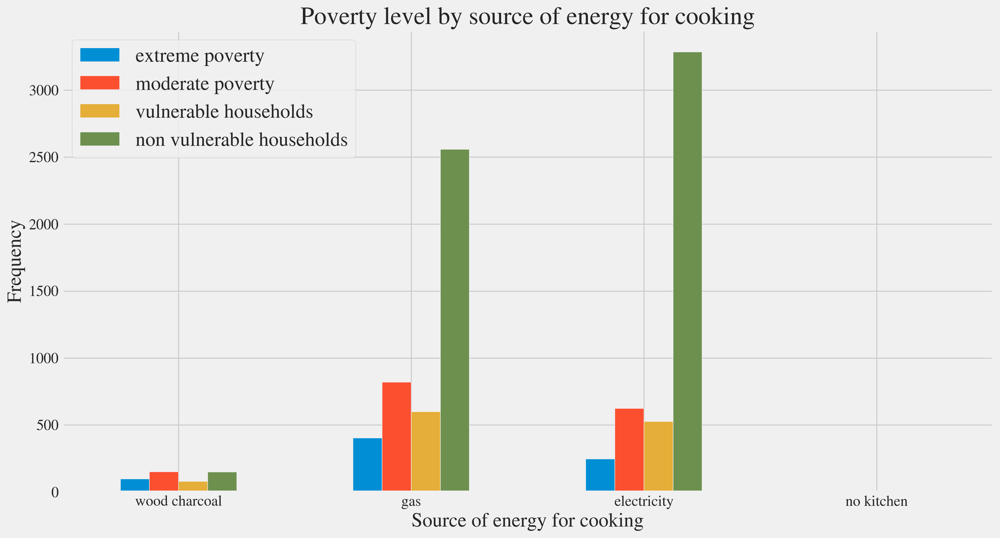

In [31]:
# barplot of poverty level by energy source
pd.crosstab([df_train.energcocinar1, df_train.energcocinar2, df_train.energcocinar3, \
             df_train.energcocinar4], df_train.Target).plot(kind='bar')
plt.title('Poverty level by source of energy for cooking', size=25)
plt.xlabel('Source of energy for cooking', size=20)
plt.xticks([0,1,2,3], ['wood charcoal', 'gas', 'electricity', 'no kitchen'], rotation=0)
plt.ylabel('Frequency', size=20)
plt.legend(labels=poverty_mapping)
plt.show()

Distribution of poverty level by household wall types

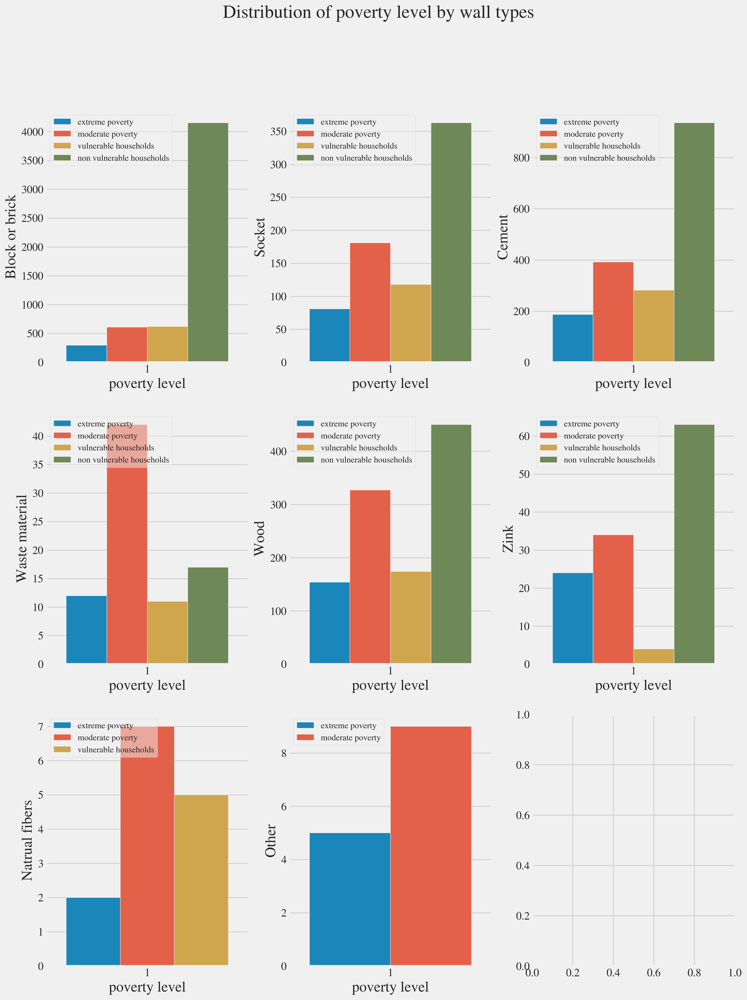

In [32]:
wall_v = [x for x in df_train if x.startswith('pared')]
wall_v1 = ['Block or brick', 'Socket', 'Cement', 'Waste material', 'Wood', 'Zink', 'Natrual fibers', 'Other']
plt.subplots(3, 3, figsize=(15, 20), sharex=False, sharey=False)
for i in range(len(wall_v)):
    plt.subplot(3, 3, i+1)
    sns.countplot(wall_v[i], data = df_train[df_train[wall_v[i]]==1], hue= 'Target')
    plt.xlabel('poverty level',fontsize=20); plt.ylabel(wall_v1[i],fontsize=20)
    plt.legend(loc='upper left', framealpha=0.5, prop={'size':'small'}, labels=poverty_mapping)
    plt.suptitle('Distribution of poverty level by wall types', fontsize=25)
plt.show()
                                             

In [33]:
# Create correlation matrix
corr_matrix = df_train.corr()
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
# Find index of feature columns with correlation greater than 0.95
strongest = [column for column in upper.columns if any(abs(upper[column]) > 0.95)]
print(strongest)


['tamhog', 'hhsize', 'coopele', 'female', 'hogar_total', 'area2', 'SQBage', 'SQBhogar_total', 'agesq']


This heatmap plot below showed that there are a number of variables that have a weak correlation with the Target. There are also high correlations between some variables (such as education and female under 12 years old) which could pose an issue because of collinearity.

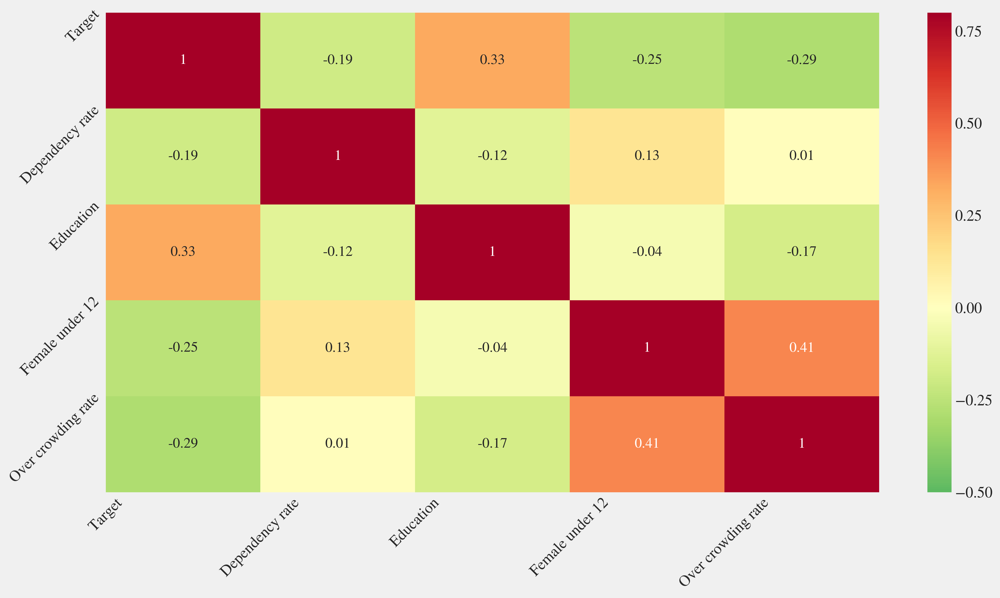

In [34]:
variables = ['Target', 'dependency', 'meaneduc', 'r4m1', 'overcrowding']
var_number = [0, 1, 2, 3, 4]
var_name = ['Target', 'Dependency rate', 'Education', 'Female under 12', 'Over crowding rate']
corr_mat = df_train[variables].corr().round(2)
sns.heatmap(corr_mat, vmin = -0.5, vmax = 0.8, center = 0, cmap = plt.cm.RdYlGn_r, \
            annot = True, xticklabels=True, yticklabels=True)
plt.xticks(var_number, var_name, rotation=45)
plt.yticks(var_number, var_name, rotation=45)
plt.show()

From the metric plot below, we can indicate that the extreme poverty level (1) has the highest correlation rate with Zink wall(0.19), whereas the lowest rate is for block or brick wall (0.052), which generally use for the high-quality houses at non-vulnerable poverty level(0.73) and the lowest rate is waste material wall(0.21) for the non-vulnerable.

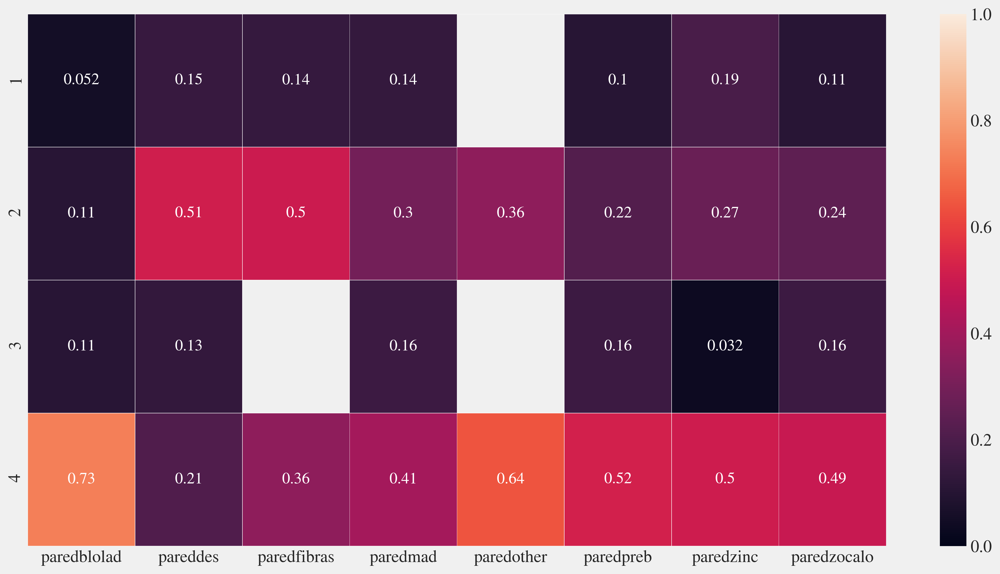

In [35]:
floor_v = [x for x in df_train if x.startswith('pared')]
floor_material = {}
for material in floor_v:
    pov_level = df_train['Target'][(df_train['Target'].notnull())&(df_train[material]>0)].value_counts()
    in_level = ((df_train['Target'].notnull())&(df_train[material]>0)).sum()
    floor_material[material] = (pov_level/in_level).to_dict()
    
temp = pd.DataFrame(floor_material)
sns.heatmap(temp, vmin = 0 ,vmax = 1, annot=True, linewidths=.1, linecolor='white')
plt.show()

## 5 Clustering analysis

We use K-Means algorithm to find out if these 3 subsets below has clusters by the following steps: 

In [36]:
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn import metrics

In [37]:
cluster_list = ['v2a1', 'rooms', 'r4t3','rez_esc','tipovivi1','tipovivi2','tipovivi3']
cluster_list1 = [col for col in df_train.columns if col not in ['Target', 'Id', 'idhogar']]
cluster_list2 = [col for col in df_train.columns if col not in ['Target', 'Id', 'idhogar']]

remove_list = ['SQBescolari','SQBedjefe','SQBdependency','SQBmeaned', \
               'agesq', 'hacdor', 'hhsize', 'dis', 'male', 'female', 'bedrooms', \
               'computer', 'television', 'mobilephone', 'age']


for col in remove_list:
    cluster_list2.remove(col)

In [38]:
def make_km(X):
    km = KMeans(n_clusters=4, init='k-means++', max_iter=1000, n_init=10, verbose=0, random_state=3425)
    km.fit(X)
    predictions = km.predict(X)
    print 'Silhouette sxcore = ', metrics.silhouette_score(X, predictions)
    return km

A function to calculate KMeans accuracy rate:

In [39]:
def test_km(km, X):
    correct = 0
    for i in range(len(X)):
        predict_me = np.array(X[i].astype(float))
        predict_me = predict_me.reshape(-1, len(predict_me))
        prediction = km.predict(predict_me)
        if (prediction[0]+1) == y[i]:
            correct += 1
    return 1.0*correct/len(X)

Test the accuracy for cluster_list:

In [40]:
X = np.array(df_train[cluster_list].astype(float))
y = df_train.Target
km = make_km(X)
print 'Test accuracy=', test_km(km, X)

Silhouette sxcore =  0.85234219913
Test accuracy= 0.128701475358


Test the accuracy for cluster_list1:

In [41]:
X = np.array(df_train[cluster_list1].astype(float))
y = df_train.Target
km = make_km(X)
print 'Test accuracy=', test_km(km, X)

Silhouette sxcore =  0.839997169338
Test accuracy= 0.101287014754


Test the accuracy for cluster_list2:

In [42]:
X = np.array(df_train[cluster_list2].astype(float))
y = df_train.Target
km = make_km(X)
print 'Test accuracy=', test_km(km, X)

Silhouette sxcore =  0.842442352313
Test accuracy= 0.128701475358


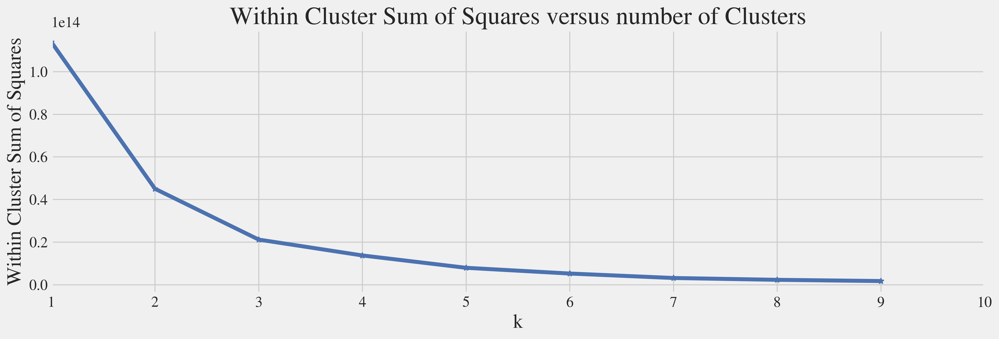

In [44]:
k_range = range(1,10)
est = [KMeans(n_clusters = k, init='k-means++', max_iter=1000, n_init=10, \
              verbose=0, random_state=3425).fit(df_train[cluster_list2].values) for k in k_range]

# Generally want to minimize WSS, while also minimizing k
within_cluster_sum_squares = [e.inertia_ for e in est]
fig, axes = plt.subplots()
fig.set_size_inches(15,10)
# Plot the results
plt.subplot(212)
plt.plot(k_range, within_cluster_sum_squares, 'b*-')
plt.xlim([1,10])
plt.grid(True)
plt.xlabel('k', fontsize=20)
plt.ylabel('Within Cluster Sum of Squares', fontsize=20)
plt.title('Within Cluster Sum of Squares versus number of Clusters', fontsize=25)
plt.show()

From the result above, we can indicate that the features has less than 0.2 accuracy. We have to use feature engineering method to improve the accuracy.

## 6, New features engineering and data preparation  

### 6.1 Create new features for the predictive models 

#### a, mobileandtabletsperhead

As indicated above, we have columns 'qmobilephone' (number of mobile phone owns) and 'v18q1' (number of tablets owns) that are important features for the prediction model. We can build a new column 'mobileandtabletsperhead', which indicated the number of mobile phone and tablets owned per head in a household, eg:

$$mobile \: phone \: and \: tablets \: per \:  head =\frac{ (mobile \: phone \: number + tablets \: number)  }{ Household \:  size }$$

or


$$mobileandtabletsperhead =\frac{ (qmobilephone + v18q1)  }{ hhszie }$$

In [45]:
df_train['mobileandtabletsperhead'] = 1.0*(df_train['qmobilephone'] + df_train['v18q1'] ) / df_train['hhsize']
df_test['mobileandtabletsperhead'] = 1.0*(df_test['qmobilephone'] + df_test['v18q1'] ) / df_test['hhsize']

In [46]:
df_train.mobileandtabletsperhead.unique()

array([ 1.        ,  2.        ,  0.        ,  0.25      ,  0.5       ,
        1.33333333,  0.6       ,  0.66666667,  1.5       ,  1.66666667,
        2.33333333,  0.8       ,  0.33333333,  0.4       ,  0.85714286,
        0.57142857,  0.83333333,  1.25      ,  0.44444444,  0.75      ,
        7.        ,  5.        ,  0.2       ,  1.75      ,  1.16666667,
        0.16666667,  2.5       ,  0.71428571,  1.2       ,  0.36363636,
        6.        ,  3.        ,  4.        ,  8.        ,  0.28571429,
        1.4       ,  1.6       ,  2.66666667,  0.875     ,  1.85714286,
        0.42857143,  0.46153846,  0.81818182,  0.375     ,  2.2       ,
        3.5       ,  0.22222222,  0.1       ,  0.41666667,  0.14285714,
        0.88888889,  0.125     ])

In [47]:
df_test.mobileandtabletsperhead.unique()

array([ 0.66666667,  3.        ,  2.        ,  1.        ,  1.5       ,
        1.25      ,  2.33333333,  0.        ,  0.8       ,  0.33333333,
        0.5       ,  1.4       ,  0.54545455,  0.4       ,  0.75      ,
        1.33333333,  1.66666667,  0.6       ,  0.25      ,  4.        ,
        0.85714286,  1.16666667,  0.83333333,  2.5       ,  1.75      ,
        0.71428571,  7.        ,  0.22222222,  0.375     ,  0.77777778,
        0.57142857,  0.625     ,  0.61538462,  3.5       ,  1.2       ,
        0.42857143,  6.        ,  8.        ,  1.375     ,  0.2       ,
        1.8       ,  2.66666667,  1.6       ,  1.125     ,  0.55555556,
        1.11111111,  0.90909091,  1.14285714,  1.42857143,  1.57142857,
        1.83333333,  3.25      ,  0.3       ,  3.66666667,  0.28571429,
        0.875     ,  5.        ,  0.16666667,  0.45454545,  0.14285714,
        0.125     ,  0.44444444,  0.36363636,  0.1       ,  3.33333333,
        0.07692308,  1.28571429,  0.23076923])

#### b, youthandoldrate  
We also create a new column 'youthandoldrate', which is the percentage of total persons younger than 12 years old plus persons older than 65 years old, divided by household size

$$youthandoldrate =\frac{ (r4t1 + hogar\_mayor)  }{ hhszie }$$

In [48]:
df_train['youthandoldrate']=1.0* (df_train['r4t1'] + df_train['hogar_mayor'])/df_train['hhsize']
df_test['youthandoldrate']=1.0* (df_test['r4t1'] + df_test['hogar_mayor'])/df_test['hhsize']

####  c, dependency1  
The last new column 'dependency1' is calculated as below, which is the percentage of total persons younger than 20 years old plus persons older than 65 years old, divided by total individuals in the household, these values will be between 0 and 1 only.

$$dependency1 =\frac{ (hogar\_nin + hogar\_mayor)  }{ hogar\_total }$$

In [49]:
df_train['dependency1'] = 1.0 * (df_train['hogar_nin'] + df_train['hogar_mayor']) /df_train['hogar_total']
df_test['dependency1'] = 1.0 * (df_test['hogar_nin'] + df_test['hogar_mayor']) /df_test['hogar_total']

Put these tow columns into a list named new_lists

In [50]:
newcol_lists = ['mobileandtabletsperhead', 'youthandoldrate', 'dependency1']

### 6.2 Create feature lists

The features below will be used for all predictive models, they are selected based on the importance weights of the columns.

The features in the remove lists have been considered less important, and have been removed from the feature lists.

In [51]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [52]:
train_list = [col for col in df_train.columns if col not in ['Target', 'Id', 'idhogar']]

remove_list = ['SQBescolari','SQBedjefe','SQBdependency','SQBmeaned', \
               'agesq', 'hacdor', 'hhsize', 'dis', 'male', 'female', 'bedrooms', \
               'computer', 'television', 'mobilephone', 'age']


for col in remove_list:
    train_list.remove(col)


### 6.3 Create subset for training and testing, including normalization and standardization

Data for the model training X and y are gathered as below, we use feature selection method to create X_new as comparison features.

In [53]:
X = df_train[train_list]
y = df_train.Target

X_new = SelectKBest(chi2, k=50).fit_transform(X, y)

To evaluate our algorithms, we split the dataset (X, y) into two parts: the training set X_train (50%) and the testing set X_test (50%)

In [54]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, test_size=0.5)

X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y, random_state=1, test_size=0.5)

print "Split X train=", X_train.shape, "X test=", X_test.shape
print "Split y train=", y_train.shape, "y test=", y_test.shape

Split X train= (4778, 128) X test= (4779, 128)
Split y train= (4778,) y test= (4779,)


We also create the training set and testing set, with less features listed as below, for comparison of the feature engineering results

These features are randomly chosen for the propose and do not represent the true value of each features

In [55]:
less_list = ['v2a1', 'rooms', 'r4t3','rez_esc','tipovivi1','tipovivi2','tipovivi3']
X_train_less=pd.DataFrame()
X_test_less=pd.DataFrame()

for col in less_list:    
    X_train_less[col] = X_train[col]
    X_test_less[col] = X_test[col]

Training ans testing data standardization

In [56]:
from sklearn import preprocessing

std_scale = preprocessing.StandardScaler().fit(X_train)
X_train_std = std_scale.transform(X_train)
X_test_std = std_scale.transform(X_test)

Training and testing data normalization

In [57]:
minmax_scale = preprocessing.MinMaxScaler().fit(X_train)

X_train_minmax = minmax_scale.transform(X_train)
X_test_minmax = minmax_scale.transform(X_test)

## 7, kNN predictive models  

Before start kNN models, we build some functions to speed up the training and evaluation procedure, the function takes metric name as parameters to find the best sutable k values.

**Function 1: knn modeling function**  
The parameters are k value and metric name, return an instance of knn model

In [58]:
from sklearn.neighbors import KNeighborsClassifier

def kNN(k, metric_name):
    return  KNeighborsClassifier(n_neighbors=k, metric=metric_name)

**Function 2: calculate the best k values for a kNN model**

Please note this function will only calculate k values between 2 and 50, to reduce the running times.

This function takes training set and testing set along with the metric name of the kNN model, return the best fitted kNN model and evaluation result.

In [59]:
def kNN_findbestk(X_a, y_a, X_b, y_b, metric_name):
    score = -1.0
    n=-1;
    for k in range(2,50):
        knn = kNN(k, metric_name)
        knn.fit(X_a, y_a)
        result = knn.predict(X_b)
        if score < knn.score(X_b, y_b):
            score = knn.score(X_b, y_b)
            n=k
    print 'best score=', score, 'at k=', n
    knn= kNN(n,  metric_name)
    knn.fit(X_a, y_a)
    result = knn.predict(X_b)
    return knn, result

**Function 3: evaluation function**  

This function is to evaluate different machine learning algorithms, using (1)model score, (2) metrics accuracy score, (3) metrics classification report, (4) metrics confusion matrix, and (5) 5 fold cross validated accuracy scores

In [60]:
# evaluation functions
from sklearn import metrics
from sklearn.model_selection import cross_val_score
    
def model_evaluation(model, X_test, y_test, result):
    score = model.score(X_test, y_test)
    print "score=", score
    print "metrics accuracy score=", metrics.accuracy_score(y_test, result)
    mcr = metrics.classification_report(y_test, result)
    print mcr

    mcm = metrics.confusion_matrix(y_test, result)
    print mcm

    scores = cross_val_score(model, X_test, y_test, cv=5, scoring='accuracy')
    print "cross val score=", scores
    print 'mean cross validation score=', scores.mean()
    print 'STD=', scores.std()

Now we start to experience with different k values and different metric parameters

### 7.1 metric='euclidean'  

First we train the knn model with metric = 'euclidean' and k values from 1 to 50, to find the best k values for the best score:

Run above function with split dataset and 'euclidean' as input parameters.

In [61]:
knn, result = kNN_findbestk(X_train, y_train, X_test, y_test, 'euclidean')

best score= 0.636534839925 at k= 31


From the result above, the best k value is 31, and the accuracy score is 0.64

Now we evaluate the kNN model using user defined function:


In [62]:
model_evaluation(knn, X_test, y_test, result)

score= 0.636534839925
metrics accuracy score= 0.636534839925
             precision    recall  f1-score   support

          1       0.22      0.02      0.04       364
          2       0.40      0.11      0.17       803
          3       0.22      0.02      0.03       588
          4       0.66      0.97      0.78      3024

avg / total       0.53      0.64      0.53      4779

[[   9   40    7  308]
 [  17   85   15  686]
 [  10   18   10  550]
 [   5   67   14 2938]]
cross val score= [ 0.63218391  0.6415883   0.63218391  0.63874346  0.63903463]
mean cross validation score= 0.636746839168
STD= 0.00385488896477


Now we calculate cross validated accuracy scores and plot the k values and the scores:

In [63]:
# search for an optimal value of K for KNN model using cross validated accuracy scores
def plt_cross_val_score(X_test, data_type, metric_name):
    k_range = range(2,50)
    k_scores = []
    for k in k_range:
        knn = KNeighborsClassifier(n_neighbors=k, metric = metric_name)
        scores = cross_val_score(knn, X_test, y_test, cv=10, scoring='accuracy')
        k_scores.append(scores.mean())
    plt.plot(k_range, k_scores)
    plt.xlabel("Value of K", fontsize=20)
    plt.ylabel("Cross validated accuracy score", fontsize=20)
    plt.title("K values vs cross validated accuracy scores for kNN model with %s, metric = %s" \
              %(data_type, metric_name))
    plt.show()
              

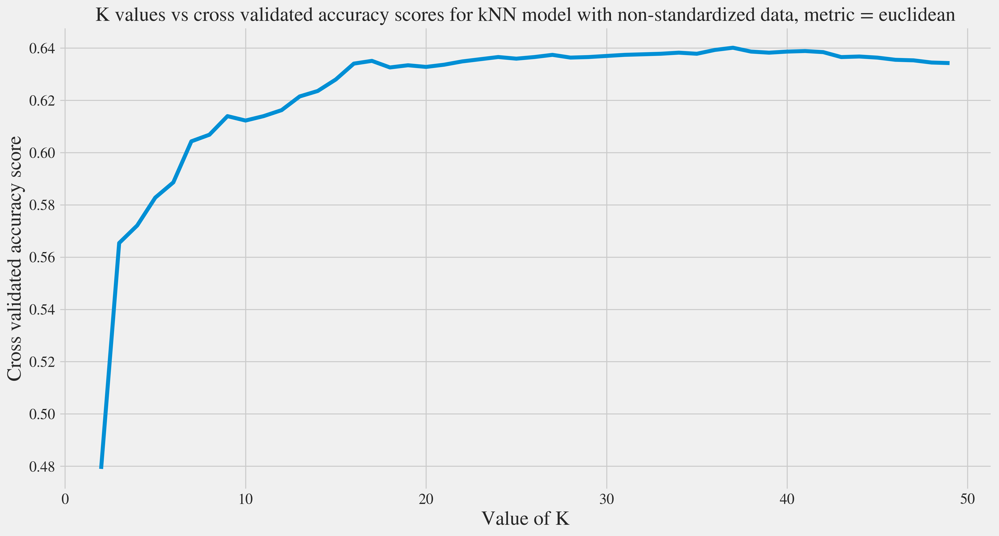

In [64]:
plt_cross_val_score(X_test, 'non-standardized data', 'euclidean')

We compute the kNN model's $R^2$ and RMSE at different k values and plot as below:

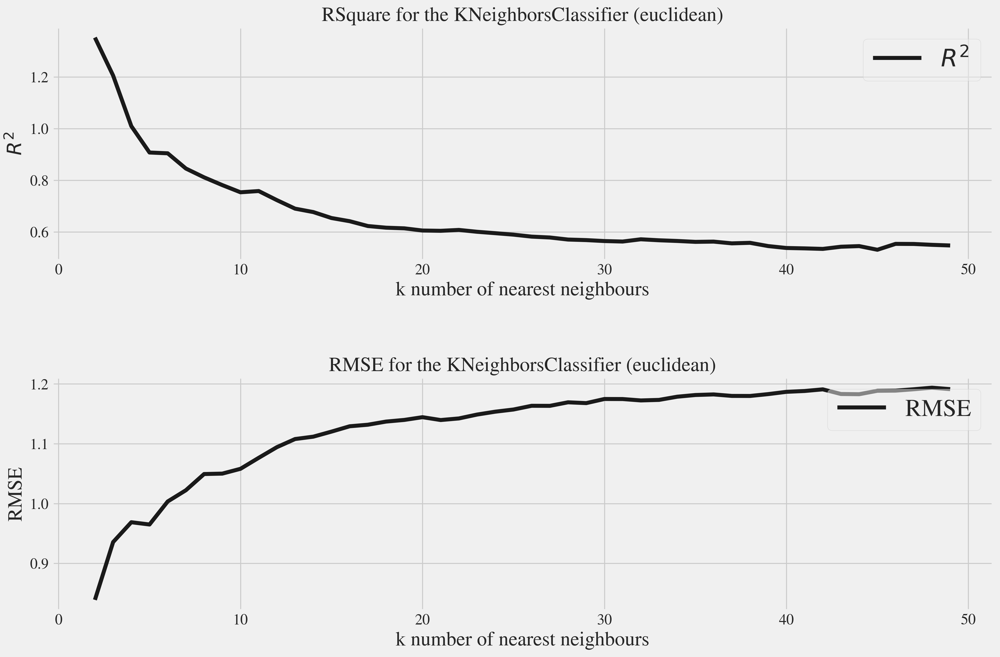

In [65]:
def calculate_regression_goodness_of_fit(ys, y_hat):
    ss_total = 0; ss_residual = 0; ss_regression = 0; y_mean = ys.mean()
    for i in range(len(ys)):
        ss_total += np.square(ys.iat[i] - y_mean)
        ss_residual += np.square(ys.iat[i] - y_hat[i])
        ss_regression += np.square(y_hat[i] - y_mean)
    r_square = ss_regression / ss_total
    rmse = np.sqrt( ss_residual / float(len(ys)) )
    return r_square, rmse

x = np.reshape(X_train.values, (len(X_train), X_train.shape[1])) + 0.001
rsquare_arr = []
rmse_arr = []
for k in range(2, 50):
        knn1 = KNeighborsClassifier(n_neighbors=k, metric = 'euclidean')
        y_hat = knn1.fit(X_train, y_train).predict(x)
        rsquare, rmse = calculate_regression_goodness_of_fit(y_train, y_hat)
        rmse_arr.append(rmse)
        rsquare_arr.append(rsquare)
        
plt.subplots(2,1, figsize=(15,10))
plt.subplot(2, 1, 1)
plt.plot(range(2, 50), rsquare_arr, c='k', label='$R^2$ ')
plt.axis('tight'); plt.xlabel('k number of nearest neighbours', fontsize=20); plt.ylabel('$R^2$', fontsize=20)
plt.legend(loc='upper right',framealpha=0.5, prop={'size':'xx-large'})
plt.title("RSquare for the KNeighborsClassifier (euclidean)", fontsize=20)
plt.subplots_adjust( hspace=0.5)
plt.subplot(2, 1, 2)
plt.plot(range(2, 50), rmse_arr, c='k', label='RMSE')
plt.axis('tight'); plt.xlabel('k number of nearest neighbours', fontsize=20); plt.ylabel('RMSE', fontsize=20)
plt.legend(loc='upper right',framealpha=0.5, prop={'size':'xx-large'})
plt.title("RMSE for the KNeighborsClassifier (euclidean)", fontsize=20)
plt.show()

Now we use less features to re-train the kNN classifier with same metric='euclidean' and evaluate the model

In [66]:
knn, result = kNN_findbestk(X_train_less, y_train, X_test_less, y_test, 'euclidean')

best score= 0.648462021343 at k= 29


In [67]:
model_evaluation(knn, X_test_less, y_test, result)

score= 0.648462021343
metrics accuracy score= 0.648462021343
             precision    recall  f1-score   support

          1       0.52      0.10      0.16       364
          2       0.47      0.16      0.24       803
          3       0.25      0.03      0.06       588
          4       0.67      0.97      0.79      3024

avg / total       0.57      0.65      0.56      4779

[[  35   41    8  280]
 [  14  126   23  640]
 [   6   33   19  530]
 [  12   68   25 2919]]
cross val score= [ 0.64263323  0.65203762  0.62800418  0.64921466  0.64533054]
mean cross validation score= 0.643444044192
STD= 0.00836367372218


Now we test the score with feature selection algorithm. The score of 125 features was very close to the score of 50 features.

In [68]:
print "Test accuracy for kNN (with feature selection):", knn.fit(X_train_new, y_train_new) \
            .score(X_test_new, y_test_new)

Test accuracy for kNN (with feature selection): 0.635070098347


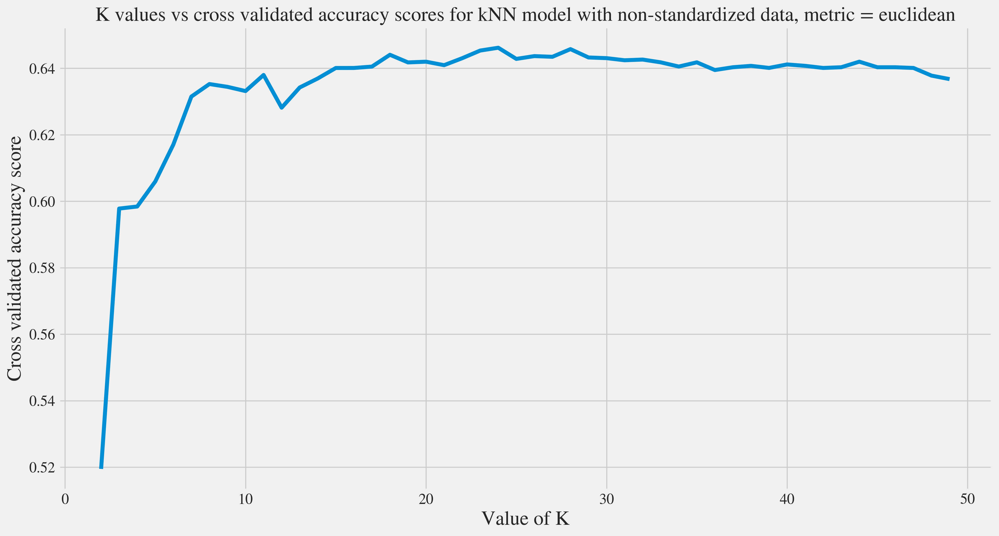

In [69]:
plt_cross_val_score(X_test_less, 'non-standardized data', 'euclidean')


**Conclusion:**  

**1, From the plots above, we can indicate that when using more features for training, the model's accuracy scores plot are slightly smoother than that models using less features, although they both shout a similar accuracy scores.**  

**2, With more features added, the best k values increase from 29 to 31.**

**3, For both models, when k values great than 40, the accuracy scores start to drop, which shows the over-fitting occurs.**

**4, Overall, when metric set to 'euclidean', the accuracy score is about 64%.**

**5, The highest score using 'euclidean' method on Kaggle was 0.349**

### 7.2 metric = 'manhattan' 

Now we do the same modeling again with metric set to 'manhattan':

In [70]:
knn, result = kNN_findbestk(X_train, y_train, X_test, y_test, 'manhattan')

best score= 0.644277045407 at k= 11


Evaluation result

In [71]:
model_evaluation(knn, X_test, y_test, result)

score= 0.644277045407
metrics accuracy score= 0.644277045407
             precision    recall  f1-score   support

          1       0.37      0.14      0.20       364
          2       0.41      0.21      0.27       803
          3       0.32      0.08      0.12       588
          4       0.69      0.93      0.79      3024

avg / total       0.57      0.64      0.58      4779

[[  51   56   15  242]
 [  33  166   35  569]
 [  15   61   45  467]
 [  38  122   47 2817]]
cross val score= [ 0.62695925  0.64263323  0.63218391  0.65445026  0.62329486]
mean cross validation score= 0.635904300931
STD= 0.0113321178821


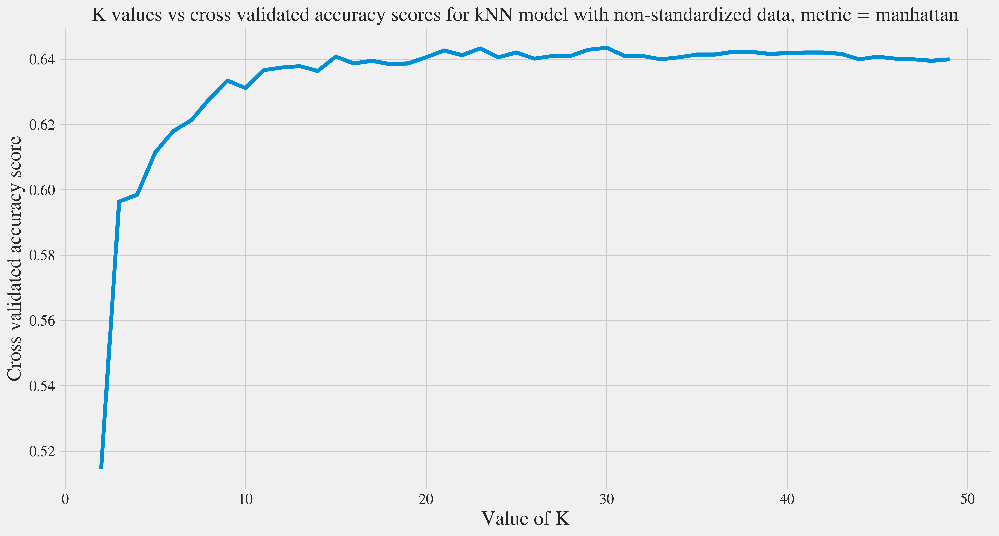

In [72]:
plt_cross_val_score(X_test, 'non-standardized data', 'manhattan')


For this highest scored kNN model, we find the most important features as below:

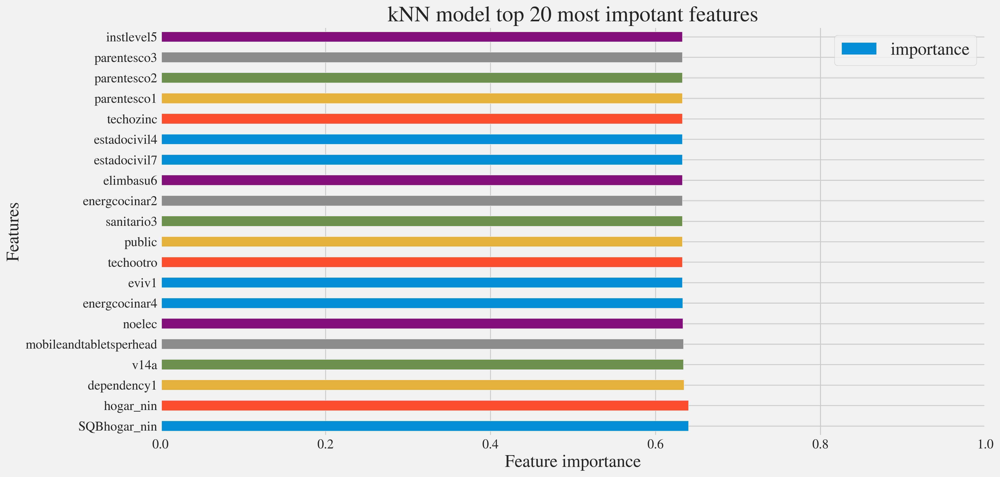

In [73]:
n_feats = X_train.shape[1]
n_imp = []
for i in range(n_feats):
    X = X_test.iloc[:, i].values.reshape(-1, 1)
    scores = cross_val_score(knn, X, y_test)
    n_imp.append([X_train.columns[i],scores.mean()])
n_imp=pd.DataFrame(n_imp)
n_imp.columns = ['feature','importance']
n_imp.sort_values(by=['importance'], ascending=False).head(20).plot(x='feature', y='importance', kind= 'barh')
plt.xlabel('Feature importance', fontsize=20)
plt.xlim((0,1))
plt.ylabel('Features', fontsize=20)
plt.title('kNN model top 20 most impotant features', fontsize=25)
plt.show()

**Conclusion:**  

**1, From the result above, we can indicate that the best k values are between 15 and 30, which dropped hugely in comparison with euclidean method.**

**2, Similar to 'euclidean' metric, when k value great than 40, the accuracy scores start to drop, which shows the over-fitting occurs.**

**3, Overall, when metric set to 'manhattan', the best accuracy score is still about 64%.**  

**4, The highest score using 'manhattan' method on Kaggle was 0.354, which was the highest in all kNN models, 0.006 higher than 'euclidean'**

### 7.3 metric = 'chebyshev'

In [74]:
knn, result = kNN_findbestk(X_train, y_train, X_test, y_test, 'chebyshev')

best score= 0.634442351956 at k= 29


Evaluation result

In [75]:
model_evaluation(knn, X_test, y_test, result)

score= 0.634442351956
metrics accuracy score= 0.634442351956
             precision    recall  f1-score   support

          1       0.29      0.03      0.05       364
          2       0.37      0.10      0.15       803
          3       0.23      0.02      0.03       588
          4       0.65      0.97      0.78      3024

avg / total       0.53      0.63      0.53      4779

[[  10   42    7  305]
 [  11   77   16  699]
 [   8   16   11  553]
 [   5   71   14 2934]]
cross val score= [ 0.63636364  0.63949843  0.62800418  0.63664921  0.62959077]
mean cross validation score= 0.634021245871
STD= 0.00443230920612


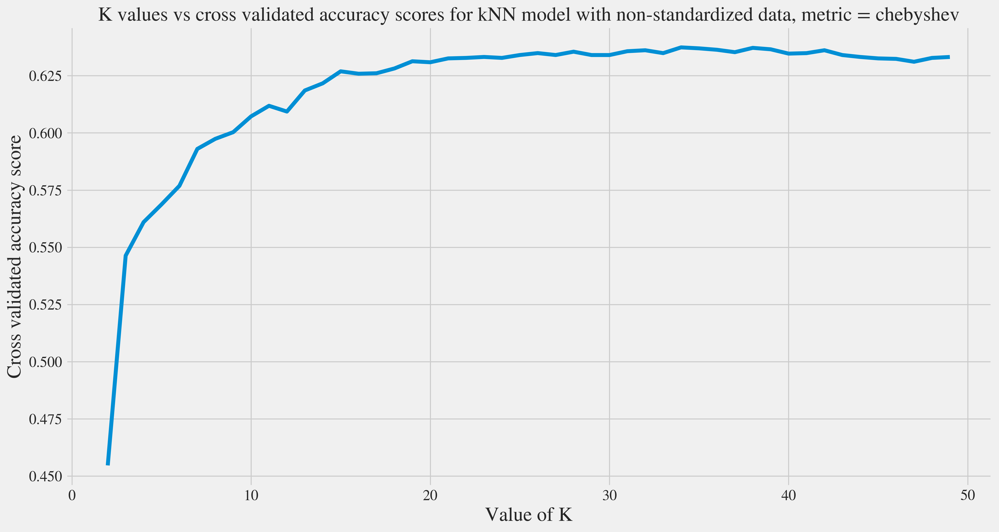

In [76]:
plt_cross_val_score(X_test, 'non-standardized data', 'chebyshev')


**Conclusion:**  

**1, From the plot above, we can indicate that the best k values is between 20-40.**

**2, Similar to 'euclidean' metric, when k value great than 40, the accuracy scores start to drop, which shows the over-fitting occurs.**

**3, Overall, when metric set to 'chebyshev', the best accuracy score is about 63%.**

**4, The highest score using 'chebyshev' method on Kaggle was 0.321**

### 7.4 metric = 'hamming'

In [77]:
knn, result = kNN_findbestk(X_train, y_train, X_test, y_test, 'hamming')

best score= 0.819836785938 at k= 3


Evaluation result

In [78]:
model_evaluation(knn, X_test, y_test, result)

score= 0.819836785938
metrics accuracy score= 0.819836785938
             precision    recall  f1-score   support

          1       0.59      0.70      0.64       364
          2       0.71      0.69      0.70       803
          3       0.73      0.55      0.63       588
          4       0.89      0.92      0.91      3024

avg / total       0.82      0.82      0.82      4779

[[ 253   46    9   56]
 [  68  551   42  142]
 [  41   82  323  142]
 [  67   97   69 2791]]
cross val score= [ 0.76280042  0.78683386  0.77429467  0.77905759  0.77649528]
mean cross validation score= 0.775896362862
STD= 0.00779807679256


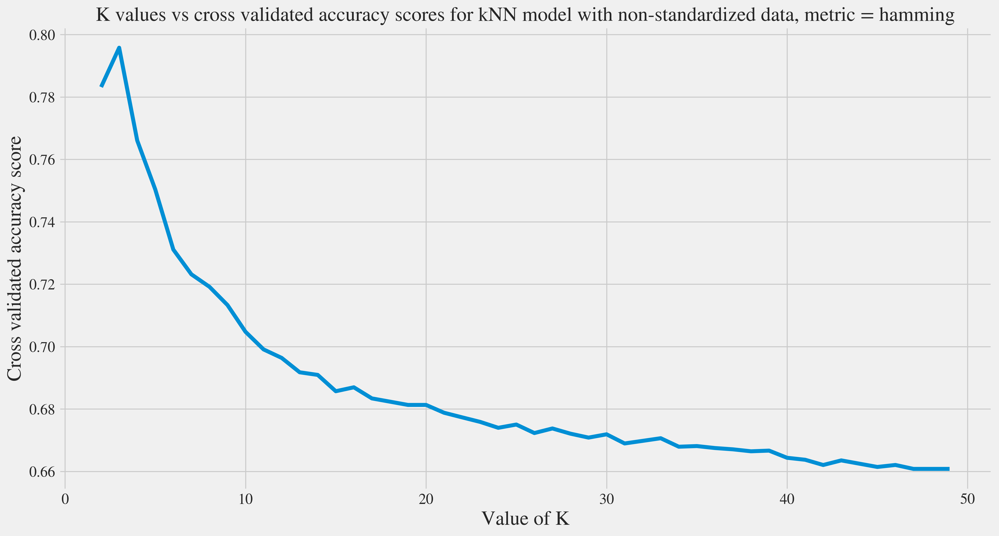

In [79]:
plt_cross_val_score(X_test, 'non-standardized data', 'hamming')


**Conclusion:**  

**1, From the plot above, we can indicate that the best k values is 3, after that, the accuracy drops dramatically.**  

**2,This kNN model is not stable when verifying cross validation method**  

**3, Although the accuracy on testing set are 82% high, the highest score using 'hamming' method on Kaggle was only 0.338**

### 7.5 metric = 'jaccard'

In [80]:
knn, result = kNN_findbestk(X_train, y_train, X_test, y_test, 'jaccard')

best score= 0.763758108391 at k= 3


Evaluation result

In [81]:
model_evaluation(knn, X_test, y_test, result)

score= 0.763758108391
metrics accuracy score= 0.763758108391
             precision    recall  f1-score   support

          1       0.49      0.61      0.54       364
          2       0.64      0.59      0.61       803
          3       0.66      0.42      0.51       588
          4       0.85      0.89      0.87      3024

avg / total       0.76      0.76      0.76      4779

[[ 222   44    7   91]
 [  80  475   42  206]
 [  56   88  248  196]
 [  99  139   81 2705]]
cross val score= [ 0.73145246  0.73145246  0.74085684  0.73403141  0.7250787 ]
mean cross validation score= 0.732574373589
STD= 0.00508772693138


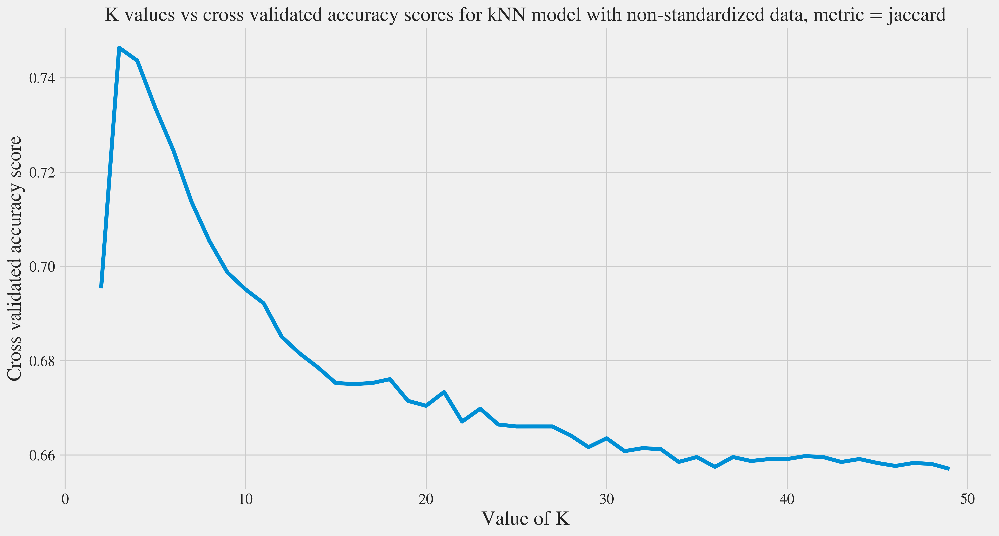

In [82]:
plt_cross_val_score(X_test, 'non-standardized data', 'jaccard')


**Conclusion:**  

**1, From the plot above, we can indicate that the best k values is 3. The accuracy drops dramatically after 3.**

**2,This kNN model is not stable when verifying cross validation method**

**3, Although the accuracy on testing set are 76%, the highest score using 'jaccard' method on Kaggle was 0.320, which is less than 'hamming'**


### 7.6 kNN model with data standardization and normalization ('manhattan')

#### 7.6.1 Standardized data kNN modeling with metric = 'manhattan'

In [83]:
knn, result = kNN_findbestk(X_train_std, y_train, X_test_std, y_test, 'manhattan')

best score= 0.819209039548 at k= 3


Evaluation result

In [84]:
model_evaluation(knn, X_test_std, y_test, result)

score= 0.819209039548
metrics accuracy score= 0.819209039548
             precision    recall  f1-score   support

          1       0.61      0.67      0.64       364
          2       0.71      0.66      0.69       803
          3       0.74      0.54      0.62       588
          4       0.88      0.93      0.91      3024

avg / total       0.81      0.82      0.81      4779

[[ 245   45    7   67]
 [  66  532   45  160]
 [  43   80  316  149]
 [  48   93   61 2822]]
cross val score= [ 0.78474399  0.78578892  0.76907001  0.79685864  0.76915005]
mean cross validation score= 0.781122323404
STD= 0.0106875514386


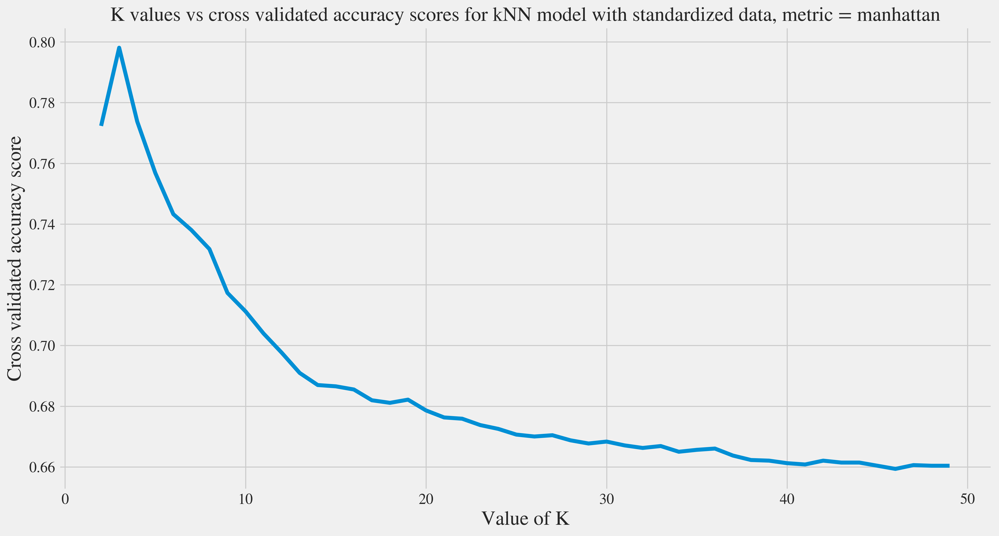

In [85]:
plt_cross_val_score(X_test_std, 'standardized data', 'manhattan')


**Conclusion:**  

**1, This plot shows that the kNN model trained with standardized data are more reliable than those models using non-standardized data, and invariable with k values at a certain conditions.**

**2, Although the accuracy rate are higher, the Kaggle leading board score on standardized data using 'manhattan' method was 0.345, which is less than the accuracy using non-standardized data of 0.354**

#### 7.6.2 Normalized data kNN modeling with metric = 'manhattan'

In [86]:
knn, result = kNN_findbestk(X_train_minmax, y_train, X_test_minmax, y_test, 'manhattan')

best score= 0.788449466416 at k= 3


Evaluation result

In [87]:
model_evaluation(knn, X_test_minmax, y_test, result)

score= 0.788449466416
metrics accuracy score= 0.788449466416
             precision    recall  f1-score   support

          1       0.53      0.66      0.59       364
          2       0.66      0.63      0.65       803
          3       0.70      0.47      0.56       588
          4       0.87      0.91      0.89      3024

avg / total       0.79      0.79      0.78      4779

[[ 239   39    7   79]
 [  79  506   44  174]
 [  52   86  275  175]
 [  77  131   68 2748]]
cross val score= [ 0.7492163   0.75966562  0.76593521  0.76125654  0.75341028]
mean cross validation score= 0.757896792941
STD= 0.00590783568425


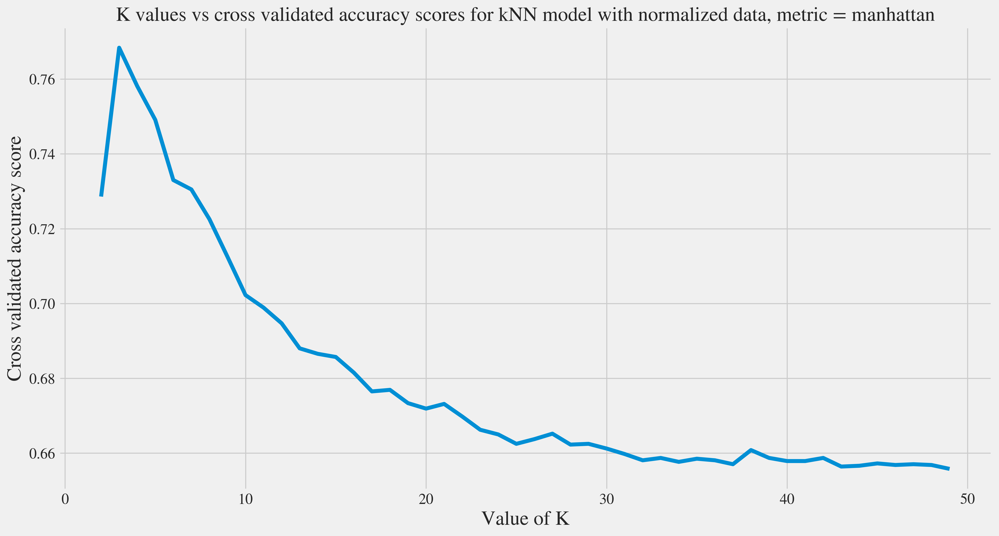

In [88]:
plt_cross_val_score(X_test_minmax, 'normalized data', 'manhattan')


**Conclusion:**  

**1, This plot shows that the kNN model trained with normalized data are not as good as the previous model trained with standardized data, and only gain good result at k=3.**

**2, The highest accuracy rate using normalized data are slightly lower than using standardized data, the Kaggle leading board score on normalized data using 'manhattan' method was 0.345, which is the same score with standardized data**

### **Conclusion on all kNN models:**  

**kNN models we built here have scored between 0.298 and 0.354 with different k values and metrics, and the highest score was the model when k set to 5 and metric set to 'manhattan', which shout out the highest kNN score of 0.354, it shows that the kNN models are not really suitable for this dataset.**

## 8, Other predictive models


We have experienced 4 other machine leaning algorithms to solve the problem, including Random Forest, Naive Bayes, Logistic Regression and LightGBM. 


Before start, we create a function for the feature importances analysis

 

In [89]:
def plot_feature_importances(kind, model, X_train, top_n=10, figsize=(15,10), title="Feature Importances"):
    if (kind==1):
        feat_imp = pd.DataFrame({'importance':model.feature_importances_}) 
    else:
        feat_imp = pd.DataFrame({'importance':model.coef_[3]}) 
    feat_imp['feature'] = X_train.columns
    feat_imp.sort_values(by='importance', ascending=False, inplace=True)
    feat_imp = feat_imp.iloc[:top_n]
    feat_imp.sort_values(by='importance', inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)
    feat_imp.plot.barh(title="Top %d  impotant features - %s" %(top_n, title), figsize=figsize, fontsize=25)
    plt.xlabel('Feature Importance Score', fontsize=20)
    plt.ylabel('Features', fontsize=20)
    plt.show()


These 4 algorithms are implemented and tested below.

### 8.1 Random forest  

Build predictive model



In [90]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(max_depth=60, random_state=60)
clf.fit(X_train, y_train)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=60, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=60, verbose=0, warm_start=False)

Evaluation result

In [91]:
result = clf.predict(X_test)

model_evaluation(clf, X_test, y_test, result)


score= 0.874241473112
metrics accuracy score= 0.874241473112
             precision    recall  f1-score   support

          1       0.79      0.73      0.76       364
          2       0.81      0.74      0.77       803
          3       0.84      0.67      0.74       588
          4       0.90      0.97      0.93      3024

avg / total       0.87      0.87      0.87      4779

[[ 265   49    4   46]
 [  38  594   30  141]
 [  12   55  392  129]
 [  19   38   40 2927]]
cross val score= [ 0.84221526  0.8338558   0.84952978  0.8460733   0.83840504]
mean cross validation score= 0.84201583422
STD= 0.00552424115638


Now we plot the top 20 important features for this model as below:

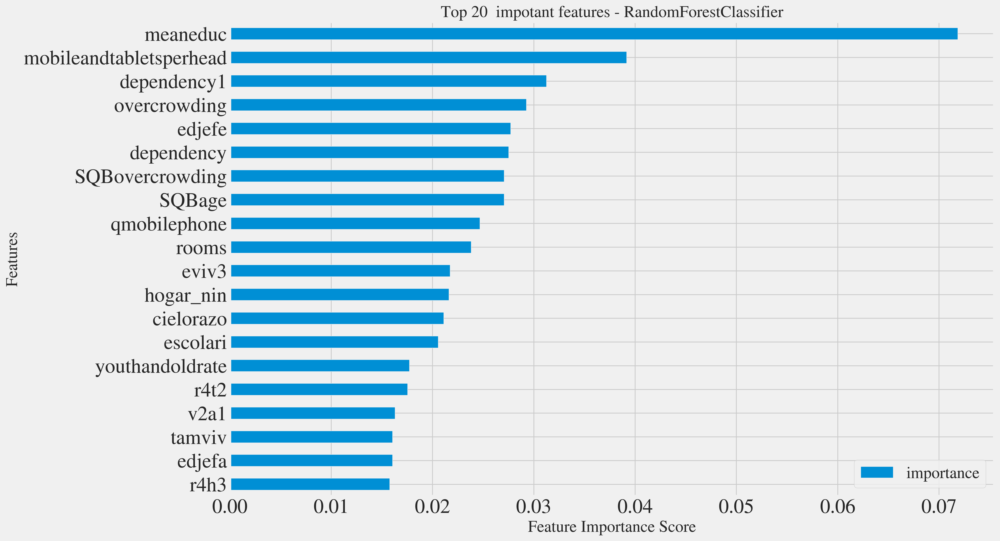

In [92]:
plot_feature_importances(1, clf, X_train, top_n=20, title=clf.__class__.__name__)

Explain of the cross validated score:

According to the result, we shout 87% accuracy on this model, also most of the class were labeled correctly, for each of class, we gain very good accuracy as well, which are listed below, with class 4 being 97% accuracy.  


The Kaggle score for this model is 0.352, which is very close to the best kNN model (0.354).

### 8.2 Naive Bayes  

#### 8.2.1 Naive Bayes model on non-standardized data

Build predictive model:

In [93]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
classifier = nb.fit(X_train, y_train)

Evaluation result:

In [94]:
result = classifier.predict(X_test)
model_evaluation(classifier, X_test, y_test, result)

score= 0.644695543001
metrics accuracy score= 0.644695543001
             precision    recall  f1-score   support

          1       0.30      0.13      0.19       364
          2       0.38      0.30      0.33       803
          3       0.21      0.06      0.09       588
          4       0.72      0.91      0.81      3024

avg / total       0.57      0.64      0.59      4779

[[  49  117   13  185]
 [  44  239   42  478]
 [  15  135   36  402]
 [  53  133   81 2757]]
cross val score= [ 0.63113898  0.65726228  0.61859979  0.64293194  0.65162644]
mean cross validation score= 0.640311884983
STD= 0.0139839693829


Naive Bayes is a very fast classifier with reasonable overall accuracy of 65%, with 91% accuracy on class 4, however, the accuracy on other 3 classes are not acceptable. Also the Kaggle score is only 0.288

However, if we reduced some correlated features and re-train the model, the Kaggle score has reached to 0.313, which indicated that this classifier is highly sensitive to correlated features, as they are voted more than once in the model and lead to over inflating of the importance.

### 8.3 Logistic Regression  

Build predictive model

In [95]:
from sklearn.linear_model import LogisticRegression
logisticRegr = LogisticRegression() # all parameters not specified are set to their default values
lr = logisticRegr.fit(X_train, y_train)


Evaluation result

In [96]:
result =  lr.predict(X_test)
model_evaluation(lr, X_test, y_test, result)


score= 0.652228499686
metrics accuracy score= 0.652228499686
             precision    recall  f1-score   support

          1       0.54      0.07      0.12       364
          2       0.51      0.14      0.22       803
          3       0.05      0.00      0.00       588
          4       0.66      0.98      0.79      3024

avg / total       0.55      0.65      0.55      4779

[[  25   58    3  278]
 [  15  115    0  673]
 [   0   26    1  561]
 [   6   27   15 2976]]
cross val score= [ 0.65726228  0.67293626  0.65935214  0.6565445   0.64428122]
mean cross validation score= 0.658075279806
STD= 0.0091187663415


Now we plot the top 20 important features for this model as below:

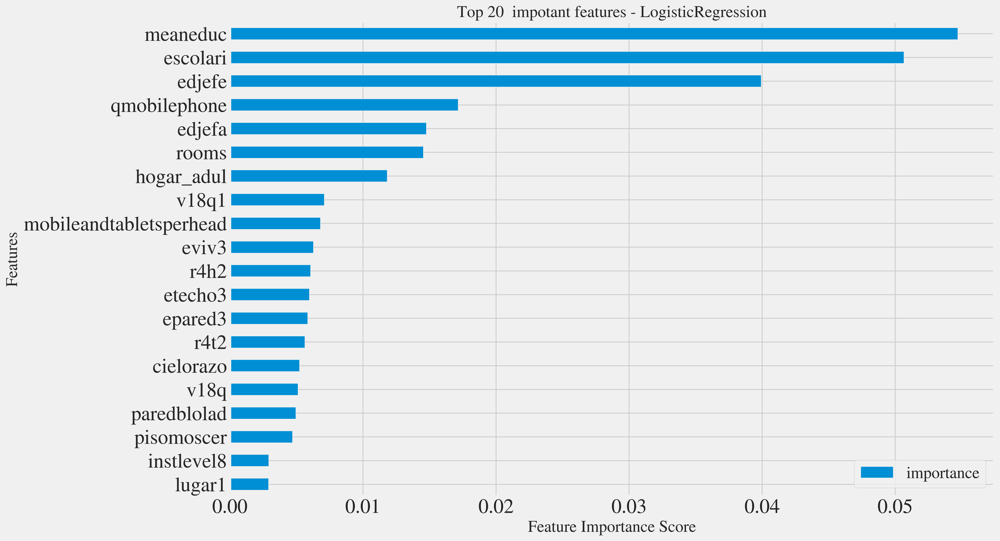

In [97]:
plot_feature_importances(0, lr, X_train, top_n=20, title=lr.__class__.__name__)

Similar Naive Bayes, Logical Regression is another very fast classifier with reasonable overall accuracy of 65%, with 98% accuracy on class 4, however, the accuracy on other 3 classes are very very bad. Also the Kaggle score is only 0.274, being the lowest score for all models.

### 8.4 LightGBM (so far the best classifier we have built for this dataset) 

Build predictive model

In [98]:
import lightgbm as lgb
gbm = lgb.LGBMClassifier(objective='multiclass', random_state=2000, max_depth=6, \
                         learning_rate=0.02, silent=True, metric='multi_logloss', n_jobs=-1, \
                         n_estimators=11000, class_weight='balanced', colsample_bytree =  0.9, \
                         num_leaves = 35, subsample = 0.9, reg_alpha=0.1, reg_lambda=0.1, \
                         num_class=4 )

gbm.fit(X_train, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight='balanced',
        colsample_bytree=0.9, learning_rate=0.02, max_depth=6,
        metric='multi_logloss', min_child_samples=20,
        min_child_weight=0.001, min_split_gain=0.0, n_estimators=11000,
        n_jobs=-1, num_class=4, num_leaves=35, objective='multiclass',
        random_state=2000, reg_alpha=0.1, reg_lambda=0.1, silent=True,
        subsample=0.9, subsample_for_bin=200000, subsample_freq=0)

Evaluation and result

In [99]:
# lightgbm model evaluation and scores
result =gbm.predict(X_test)
model_evaluation(gbm, X_test, y_test, result)

score= 0.899769826323
metrics accuracy score= 0.899769826323
             precision    recall  f1-score   support

          1       0.79      0.76      0.78       364
          2       0.84      0.81      0.82       803
          3       0.83      0.78      0.80       588
          4       0.94      0.96      0.95      3024

avg / total       0.90      0.90      0.90      4779

[[ 278   43    7   36]
 [  40  650   38   75]
 [  14   45  459   70]
 [  20   40   51 2913]]
cross val score= [ 0.86415883  0.85370951  0.86206897  0.84712042  0.86358867]
mean cross validation score= 0.858129278058
STD= 0.00666949626706


Now we plot the top 20 important features for this model as below:

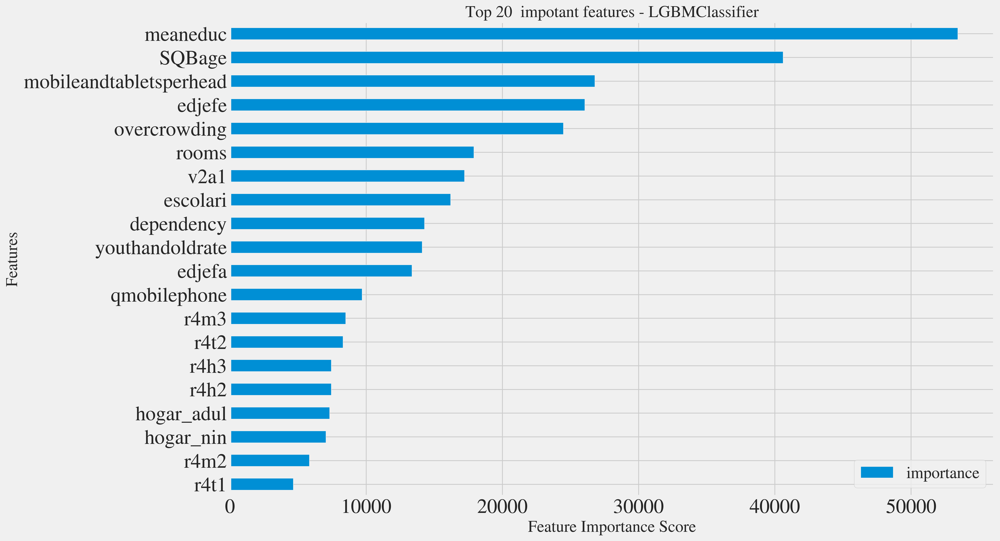

In [100]:
plot_feature_importances(1, gbm, X_train, top_n=20, title=gbm.__class__.__name__)

At last, we build the predictive model for the final submission to Kaggle

The source code are listed below

In [101]:
# The coding here is to prepare the dataset used for all predictive models from step 1 to 6
# step 7 to build the model
# step 8 to create the submission
# 1: import libraries
import numpy as np
import pandas as pd

#2: read dataset from csv
df_train = pd.read_csv('../input/train.csv')
df_test = pd.read_csv('../input/test.csv')

#3: fillna with 0
df_train.fillna(0, inplace=True)
df_test.fillna(0, inplace=True)

#4: find more null data and fill
col_lists = ['dependency', 'edjefe', 'edjefa']
dataset_lists = [df_train, df_test]

for col in col_lists:
    for df in dataset_lists:
        df[col].replace('no', '0', inplace=True)
        df[col].replace('yes', '1', inplace=True)
        df[col] = df[col].astype(float)
        
#5: make training set feature lists
train_list = [col for col in df_train.columns if col not in ['Target', 'Id', 'idhogar']]

remove_list = ['SQBescolari', 'SQBedjefe', 'SQBdependency', 'SQBmeaned', \
               'agesq', 'hacdor', 'hhsize', 'dis', 'male', 'female', 'bedrooms', \
               'computer', 'television', 'mobilephone', 'age']

for col in remove_list:
    train_list.remove(col)

df_train['mobileandtabletsperhead'] = 1.0*(df_train['qmobilephone'] + df_train['v18q1'] ) \
                / df_train['hhsize']
df_test['mobileandtabletsperhead'] = 1.0*(df_test['qmobilephone'] + df_test['v18q1'] ) \
                / df_test['hhsize']
df_train['youthandoldrate']=1.0* (df_train['r4t1'] + df_train['hogar_mayor']) / \
                df_train['hhsize']
df_test['youthandoldrate']=1.0* (df_test['r4t1'] + df_test['hogar_mayor']) / \
                df_test['hhsize']
df_train['dependency1'] = 1.0 * (df_train['hogar_nin'] + df_train['hogar_mayor']) / \
                df_train['hogar_total']
df_test['dependency1'] = 1.0 * (df_test['hogar_nin'] + df_test['hogar_mayor']) / \
                df_test['hogar_total']

newcol_lists = ['mobileandtabletsperhead', 'youthandoldrate', 'dependency1']

train_list = train_list + newcol_lists

#6: X, y and test_list
X = df_train[train_list]
y = df_train.Target
test_list = df_test[train_list].values

#7: lightgbm model
import lightgbm as lgb
gbm = lgb.LGBMClassifier(objective='multiclass', random_state=2000, max_depth=6, \
                         learning_rate=0.02, silent=True, metric='multi_logloss', n_jobs=-1, \
                         n_estimators=13000, class_weight='balanced', colsample_bytree =  0.9, \
                         num_leaves = 35, subsample = 0.9, reg_alpha=0.1, reg_lambda=0.1, \
                         num_class=4 )

gbm.fit(X, y)

#8: create predictive result and save to csv
def create_predict_submission(input_result):
    predict = pd.DataFrame()
    predict['Id'] = df_test['Id']
    predict['Target'] = input_result
    predict.to_csv('submission.csv', index=False)
    print (predict.head())

result =gbm.predict(test_list)
create_predict_submission(result)

             Id  Target
0  ID_2f6873615       4
1  ID_1c78846d2       4
2  ID_e5442cf6a       4
3  ID_a8db26a79       4
4  ID_a62966799       4


## 9, Conclusion

In this report, we have jumped into a real-world research question to predict Costa Rican household poverty level.  

We have implemented multiple predictive models and gained the results very practically.  

Our group have justed used Kaggle for the first time, spent many time on research the problem fields at the beginning.  Data cleaning and EDA has be presented. Then we have engineered 3 features. Finally we selection 125 features in different prediction models.  For the Kaggle submission, we finally used LightGBM model with 125 features plus 3 engineered features for accuracy improvement, and gained 0.414.

It is hard to say which prediction model is best to suit to a particular job since each models may be suitable for different dataset. Therefore, we need to implement most of the algorithms to find the right solutions. Our final model did well in compare to other classmate but the overall score is not extremely accurate.   

There might be some ways to improve the performance and we still need to develop our data science skills, model selection and optimal technologies.